<a href="https://colab.research.google.com/github/suryaaa33/collabpdepression/blob/main/ir_Suryadi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Dataset Source:** [Depression Datasett](https://www.kaggle.com/datasets/anthonytherrien/depression-dataset)

**Proses yang Harus di Lakukan:**
1.   Data Understanding (Exploratory Data Analysis)
2.   Data Visualization
3.   Data Preprocessing
4.   Training Model
5.   Evaluation Model



In [ ]:
# mounting gdrive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# import libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [ ]:
# load dataset
data=pd.read_csv('/content/drive/MyDrive/data mining/depression_data.csv')

### **Exploratory Data Analysis (EDA)**

**Pahami Data:**
*   Jumlah data dan jumlah features
*   Pahami setiap features mendeskripsikan data tentang apa (bisa melihat dari dekspriksi data pada sumber data (jika tersedia) atau melihat dari isi data)
*   Pahami apakah isi data telah sesuai dengan tipe data dan menggambarkan dari deskripsi features data tersebut
*   Tentukan **feature target** model dan pahami isi data dari feature tersebut apakah kategorikal atau numerik yang bersifat kontinue (hal ini yang akan menentukan apakah classification atau regression learning model)
  *   Pahami unik data nya (label/kelas) target model
  *   Pahami distribusi jumlah data berdasarkan label data target model
*   Pahami apakah terdapat data yang kosong dari setiap features
*   Pahami apakah terdapat data yang duplikat
*   Pahami korelasi data dari setiap features






In [ ]:
# cek dimensi data (banyaknya data dan features)
data.shape

(413768, 16)

In [ ]:
# cek nama-nama features
data.columns

Index(['Name', 'Age', 'Marital Status', 'Education Level',
       'Number of Children', 'Smoking Status', 'Physical Activity Level',
       'Employment Status', 'Income', 'Alcohol Consumption', 'Dietary Habits',
       'Sleep Patterns', 'History of Mental Illness',
       'History of Substance Abuse', 'Family History of Depression',
       'Chronic Medical Conditions'],
      dtype='object')

In [ ]:
# cek isi data
data.head()

,Name,Age,Marital Status,Education Level,Number of Children,Smoking Status,Physical Activity Level,Employment Status,Income,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness,History of Substance Abuse,Family History of Depression,Chronic Medical Conditions
0,Christine Barker,31,Married,Bachelor's Degree,2,Non-smoker,Active,Unemployed,26265.67,Moderate,Moderate,Fair,Yes,No,Yes,Yes
1,Jacqueline Lewis,55,Married,High School,1,Non-smoker,Sedentary,Employed,42710.36,High,Unhealthy,Fair,Yes,No,No,Yes
2,Shannon Church,78,Widowed,Master's Degree,1,Non-smoker,Sedentary,Employed,125332.79,Low,Unhealthy,Good,No,No,Yes,No
3,Charles Jordan,58,Divorced,Master's Degree,3,Non-smoker,Moderate,Unemployed,9992.78,Moderate,Moderate,Poor,No,No,No,No
4,Michael Rich,18,Single,High School,0,Non-smoker,Sedentary,Unemployed,8595.08,Low,Moderate,Fair,Yes,No,Yes,Yes


In [ ]:
# cek tipe data
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413768 entries, 0 to 413767
Data columns (total 16 columns):
 #   Column                        Non-Null Count   Dtype  
---  ------                        --------------   -----  
 0   Name                          413768 non-null  object 
 1   Age                           413768 non-null  int64  
 2   Marital Status                413768 non-null  object 
 3   Education Level               413768 non-null  object 
 4   Number of Children            413768 non-null  int64  
 5   Smoking Status                413768 non-null  object 
 6   Physical Activity Level       413768 non-null  object 
 7   Employment Status             413768 non-null  object 
 8   Income                        413768 non-null  float64
 9   Alcohol Consumption           413768 non-null  object 
 10  Dietary Habits                413768 non-null  object 
 11  Sleep Patterns                413768 non-null  object 
 12  History of Mental Illness     413768 non-nul

In [ ]:
# cek unik data untuk feature tipe data object
print('unique data feature Marital Status : ', data['Marital Status'].unique())
print('unique data feature Education Level : ', data['Education Level'].unique())
print('unique data feature Number of Children : ', data['Number of Children'].unique())
print('unique data feature Smoking Status : ', data['Smoking Status'].unique())
print('unique data feature Physical Activity Level : ', data['Physical Activity Level'].unique())
print('unique data feature Employment Status : ', data['Employment Status'].unique())
print('unique data feature Alcohol Consumption : ', data['Alcohol Consumption'].unique())
print('unique data feature Dietary Habits : ', data['Dietary Habits'].unique())
print('unique data feature Sleep Patterns : ', data['Sleep Patterns'].unique())
print('unique data feature History of Mental Illness : ', data['History of Mental Illness'].unique())
print('unique data feature History of Substance Abuse : ', data['History of Substance Abuse'].unique())
print('unique data feature Family History of Depression : ', data['Family History of Depression'].unique())
print('unique data feature Chronic Medical Conditions : ', data['Chronic Medical Conditions'].unique())



unique data feature Marital Status :  ['Married' 'Widowed' 'Divorced' 'Single']
unique data feature Education Level :  ["Bachelor's Degree" 'High School' "Master's Degree" 'Associate Degree'
 'PhD']
unique data feature Number of Children :  [2 1 3 0 4]
unique data feature Smoking Status :  ['Non-smoker' 'Former' 'Current']
unique data feature Physical Activity Level :  ['Active' 'Sedentary' 'Moderate']
unique data feature Employment Status :  ['Unemployed' 'Employed']
unique data feature Alcohol Consumption :  ['Moderate' 'High' 'Low']
unique data feature Dietary Habits :  ['Moderate' 'Unhealthy' 'Healthy']
unique data feature Sleep Patterns :  ['Fair' 'Good' 'Poor']
unique data feature History of Mental Illness :  ['Yes' 'No']
unique data feature History of Substance Abuse :  ['No' 'Yes']
unique data feature Family History of Depression :  ['Yes' 'No']
unique data feature Chronic Medical Conditions :  ['Yes' 'No']


In [ ]:
# cek unik data (label/kelas) untuk feature target
print('unique data feature History of Mental Illness : ', data['History of Mental Illness'].unique())

unique data feature History of Mental Illness :  ['Yes' 'No']


In [ ]:
# jumlah data berdasarkan label/kelas target
data.groupby('History of Mental Illness').size()

,0
History of Mental Illness,
No,287943
Yes,125825


In [ ]:
# jumlah data berdasarkan label/kelas target
data.groupby('Employment Status').size()

,0
Employment Status,
Employed,265659
Unemployed,148109


In [ ]:
# jumlah data berdasarkan label/kelas target
data.groupby('Sleep Patterns').size()

,0
Sleep Patterns,
Fair,196789
Good,87397
Poor,129582


In [ ]:
# jumlah data berdasarkan label/kelas target
data.groupby('Physical Activity Level').size()

,0
Physical Activity Level,
Active,78905
Moderate,158013
Sedentary,176850


In [ ]:
# jumlah data berdasarkan label/kelas target
data.groupby('Family History of Depression').size()

,0
Family History of Depression,
No,302515
Yes,111253


In [ ]:
# jumlah data berdasarkan label/kelas target
data.groupby('Alcohol Consumption').size()

,0
Alcohol Consumption,
High,101078
Low,139250
Moderate,173440


In [ ]:
# untuk mengetahui jumlah missing value secara keseluruhan
data.isnull().sum().sum()

0

In [ ]:
# cek data duplicated
data.duplicated().sum()

0

In [ ]:
# cek kolom data yang kosong (missing values)
data.isnull().sum()

,0
Name,0
Age,0
Marital Status,0
Education Level,0
Number of Children,0
Smoking Status,0
Physical Activity Level,0
Employment Status,0
Income,0
Alcohol Consumption,0


In [ ]:
# nilai modus dari setiap features
data.mode()

,Name,Age,Marital Status,Education Level,Number of Children,Smoking Status,Physical Activity Level,Employment Status,Income,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness,History of Substance Abuse,Family History of Depression,Chronic Medical Conditions
0,Michael Smith,42.0,Married,Bachelor's Degree,0.0,Non-smoker,Sedentary,Employed,25305.81,Moderate,Unhealthy,Fair,No,No,No,No
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26597.97,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,44225.53,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# filter atribut
num_columns=data.select_dtypes(include=['int64', 'float64'])

# median
median_values=num_columns.median()

print("Nilai median untuk kolom bertipe integer dan float:")
print(median_values)

Nilai median untuk kolom bertipe integer dan float:
Age                      49.000
Number of Children        1.000
Income                37520.135
dtype: float64


In [ ]:
# correlation
corr_matrix=num_columns.corr()

print("Matriks korelasi antara kolom bertipe integer dan float: \n")
print(corr_matrix)

Matriks korelasi antara kolom bertipe integer dan float: 

                         Age  Number of Children    Income
Age                 1.000000            0.259268 -0.065628
Number of Children  0.259268            1.000000  0.028737
Income             -0.065628            0.028737  1.000000


In [ ]:
# tendensi sentral
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,413768.0,49.000713,18.158759,18.00,33.00,49.000,65.0,80.00
Number of Children,413768.0,1.298972,1.237054,0.00,0.00,1.000,2.0,4.00
Income,413768.0,50661.707971,40624.100565,0.41,21001.03,37520.135,76616.3,209995.22


### **Visualisasi Data**

**Seaborn**

Seaborn merupakan salah satu pustaka visual Python yang berlandaskan pada matplotlib. Seaborn menyediakan antar-muka tingkat tinggi untuk menangani permasalahan terkait visualisasi data secara statistik agar tampak lebih menarik.

**Pahami Data:**
*   Apakah terdapat outlier dari setiap features
*   Pahami hubungan diantara features

| Jenis Chart |	Fungsi | Kelebihan | Kekurangan |
| --- | --- | --- | --- |
|Line plot | Menunjukkan tren atau perubahan data dari waktu ke waktu | Mudah dipahami, dapat menunjukkan tren atau perubahan data secara jelas | Tidak cocok untuk data dengan banyak kategori, dapat sulit untuk membandingkan data dari kategori yang berbeda |
| Scatter plot	| Menunjukkan hubungan antara dua variabel	| Dapat menunjukkan hubungan antara dua variabel, baik hubungan positif, negatif, atau tidak ada hubungan	| Tidak cocok untuk data dengan banyak data poin, dapat sulit untuk melihat pola hubungan |
| Histogram	| Menunjukkan distribusi data	| Dapat menunjukkan distribusi data, baik distribusi normal, skewed, atau bimodal	| Tidak cocok untuk data dengan banyak data poin, dapat sulit untuk melihat pola distribusi |
| Bar chart	| Menunjukkan perbandingan data kategori	| Mudah dipahami, dapat menunjukkan perbandingan data kategori dengan jelas	| Tidak cocok untuk data dengan banyak kategori, dapat sulit untuk membandingkan data dari kategori yang berbeda |
| Pie chart	| Menunjukkan proporsi atau persentase data kategori	| Mudah dipahami, dapat menunjukkan proporsi atau persentase data kategori dengan jelas	| Tidak cocok untuk data dengan banyak kategori, dapat sulit untuk membandingkan data dari kategori yang berbeda|
| Area plot	| Menunjukkan perubahan data dari waktu ke waktu	| Dapat menunjukkan perubahan data dari waktu ke waktu, baik peningkatan, penurunan, atau tidak ada perubahan	| Tidak cocok untuk data dengan banyak data poin, dapat sulit untuk melihat pola perubahan|

#### **Bar Cart**

1.   countplot

<Axes: xlabel='History of Mental Illness', ylabel='count'>

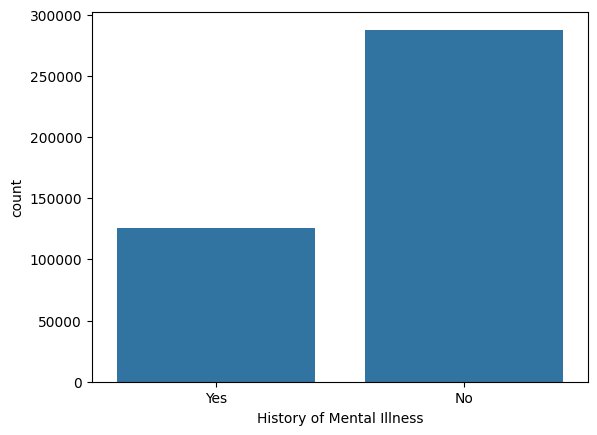

In [ ]:
sns.countplot(x='History of Mental Illness', data=data)

<Axes: xlabel='count', ylabel='History of Mental Illness'>

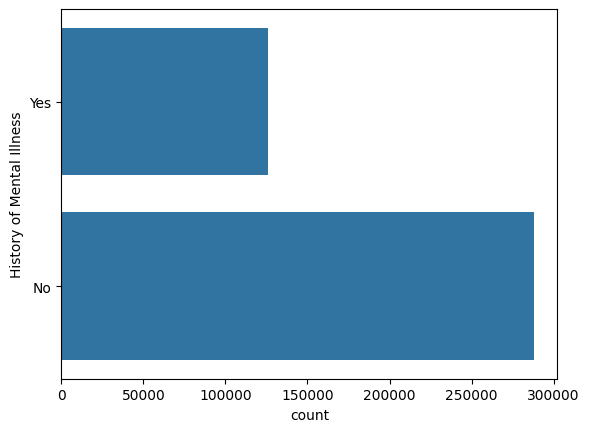

In [ ]:
sns.countplot(y='History of Mental Illness', data=data)

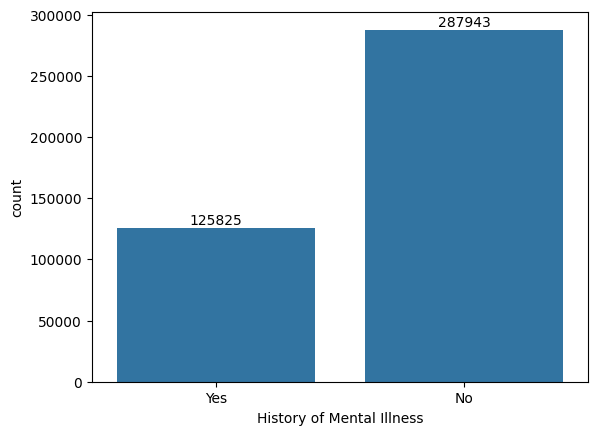

In [ ]:
count = sns.countplot(x='History of Mental Illness', data=data)

for j in count.patches:
  count.annotate(format(j.get_height(), '.0f'), (j.get_x() + j.get_width() / 2., j.get_height()),
                 ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.show()

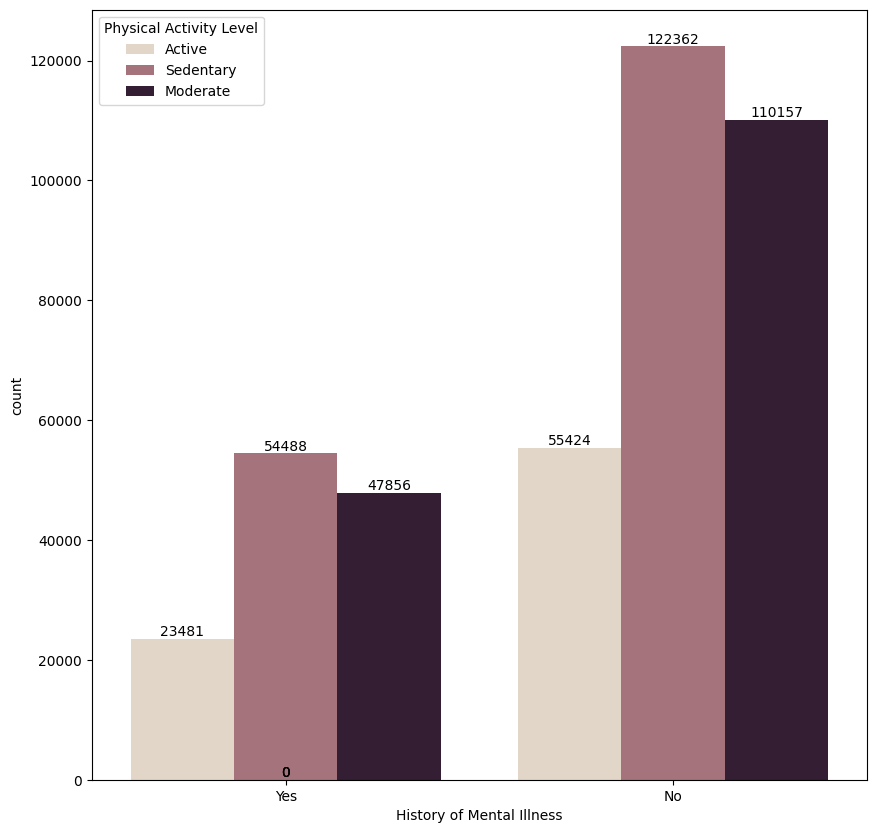

In [ ]:
plt.figure(figsize=(10, 10))
count = sns.countplot(x="History of Mental Illness", hue="Physical Activity Level", palette="ch:.25", data=data);

for j in count.patches:
  count.annotate(format(j.get_height(), '.0f'), (j.get_x() + j.get_width() / 2., j.get_height()),
                 ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.show()

2.   subplots

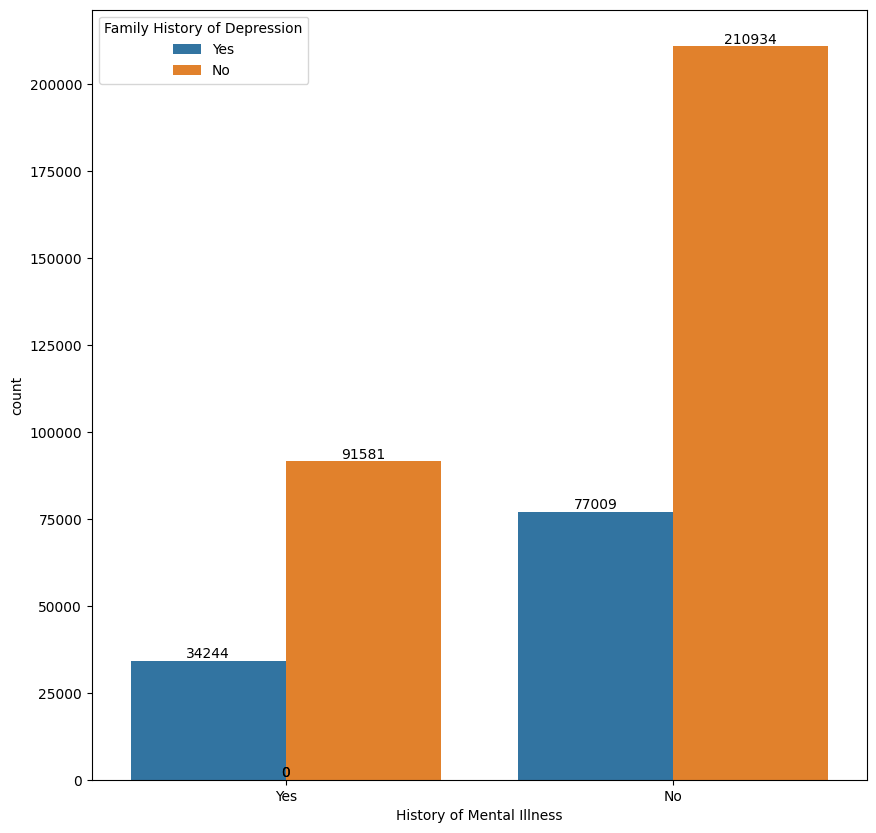

In [ ]:
f, ax = plt.subplots(figsize=(10,10))
count = sns.countplot(x="History of Mental Illness", hue="Family History of Depression", data=data);

for j in count.patches:
  count.annotate(format(j.get_height(), '.0f'), (j.get_x() + j.get_width() / 2., j.get_height()),
                 ha='center', va='center', xytext=(0, 5), textcoords='offset points')
plt.show()

3.   barplot

<Axes: xlabel='History of Mental Illness', ylabel='Income'>

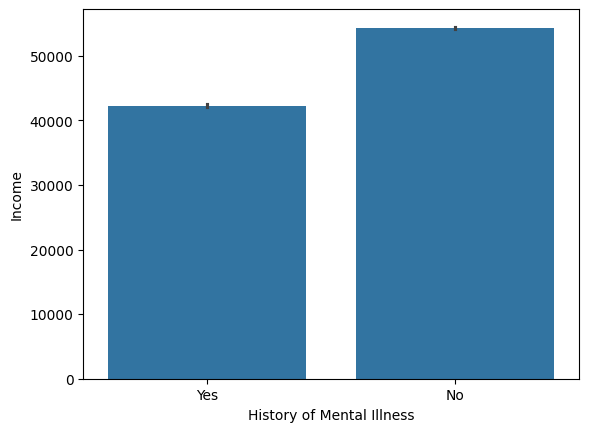

In [ ]:
sns.barplot(x='History of Mental Illness', y='Income', data=data)

<Axes: xlabel='History of Mental Illness', ylabel='Number of Children'>

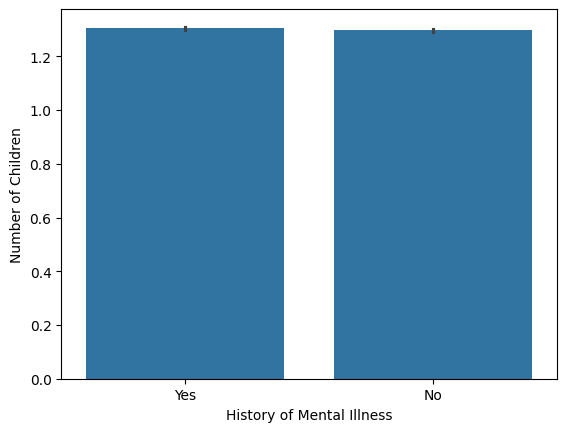

In [ ]:
sns.barplot(x='History of Mental Illness', y='Number of Children', data=data)

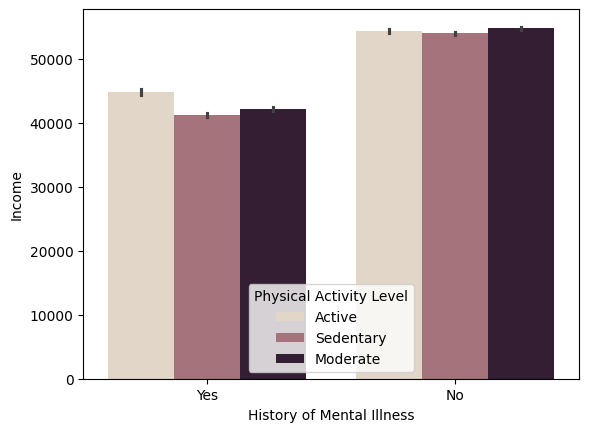

In [ ]:
sns.barplot(x="History of Mental Illness", y="Income", hue="Physical Activity Level", palette="ch:.25", data=data)
plt.show()

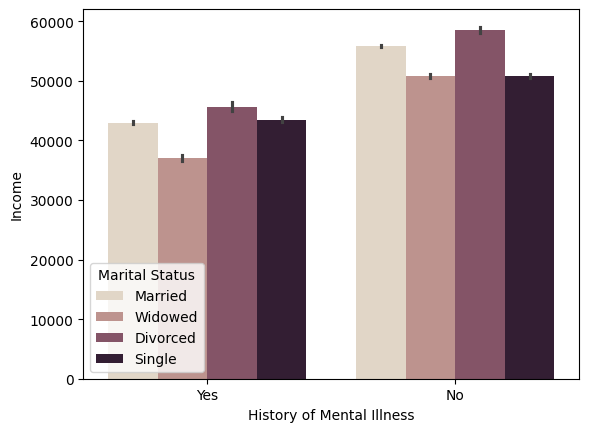

In [ ]:
sns.barplot(x="History of Mental Illness", y="Income", hue="Marital Status", palette="ch:.25", data=data)
plt.show()

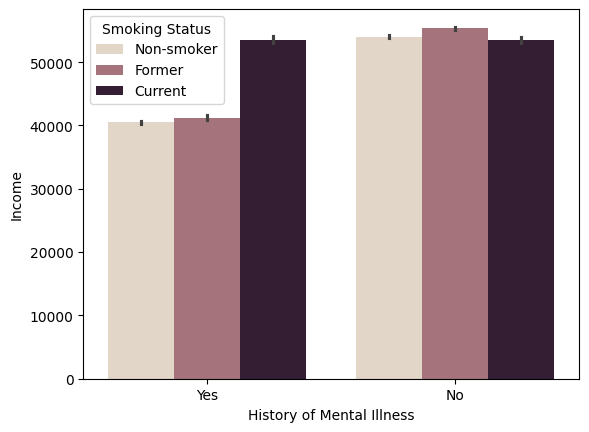

In [ ]:
sns.barplot(x="History of Mental Illness", y="Income", hue="Smoking Status", palette="ch:.25", data=data)
plt.show()

#### **Boxplot**

4.   boxenplot

<Axes: xlabel='History of Mental Illness', ylabel='Income'>

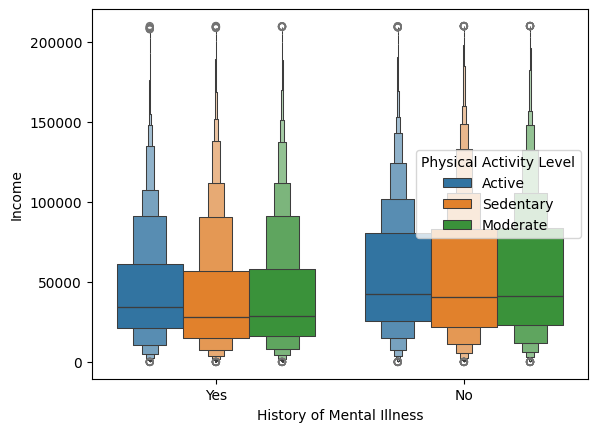

In [ ]:
sns.boxenplot(x="History of Mental Illness", y="Income", hue="Physical Activity Level", data=data)

<Axes: xlabel='History of Mental Illness', ylabel='Income'>

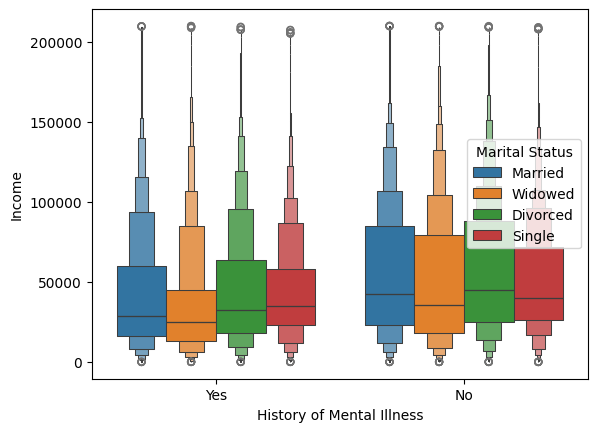

In [ ]:
sns.boxenplot(x="History of Mental Illness", y="Income", hue="Marital Status", data=data)

5.   boxplot

<Axes: xlabel='History of Mental Illness', ylabel='Age'>

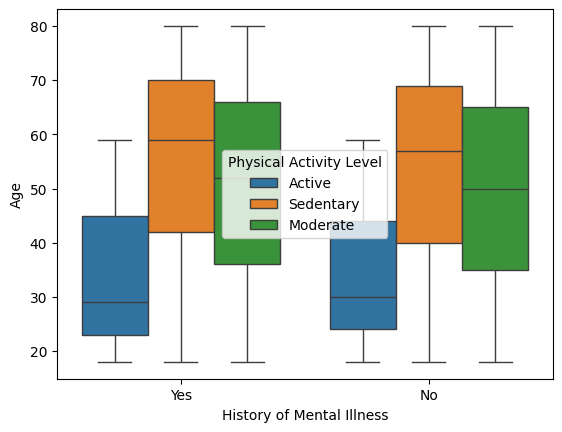

In [ ]:
sns.boxplot(x="History of Mental Illness", y="Age", hue="Physical Activity Level", data=data)

<Axes: xlabel='History of Mental Illness', ylabel='Age'>

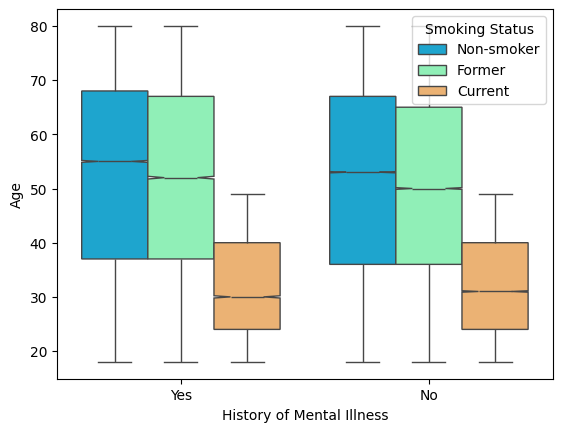

In [ ]:
sns.boxplot(x='History of Mental Illness', y='Age', hue="Smoking Status", data=data, palette='rainbow', notch=True)

<Axes: xlabel='History of Mental Illness', ylabel='Age'>

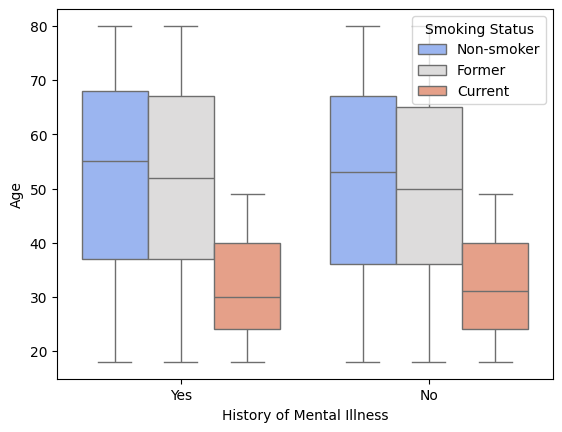

In [ ]:
sns.boxplot(x="History of Mental Illness", y="Age", hue="Smoking Status", data=data, palette='coolwarm')

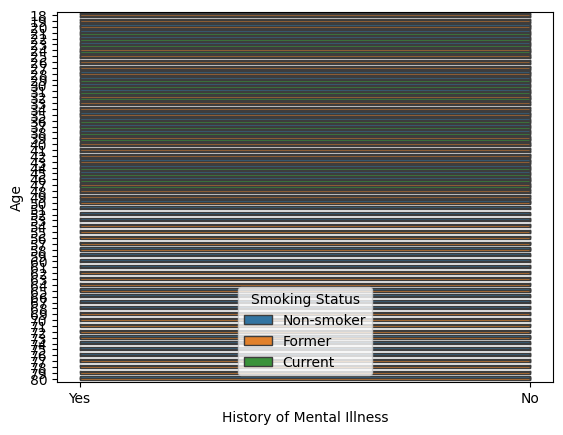

In [ ]:
sns.boxplot(x="History of Mental Illness", y="Age", hue="Smoking Status", data=data, orient='h');

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


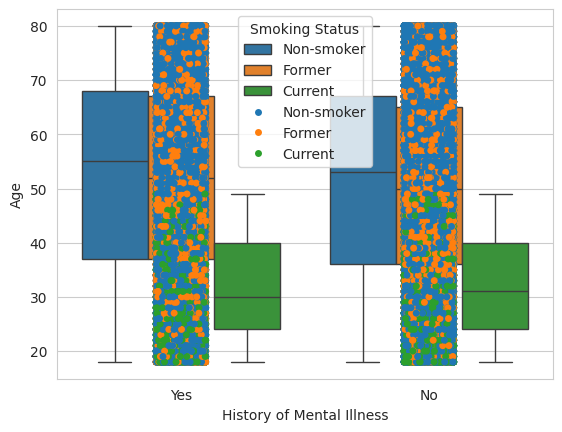

In [ ]:
sns.set_style('whitegrid')
ax= sns.boxplot(x="History of Mental Illness", y="Age", hue="Smoking Status", data=data)
ax = sns.stripplot(x="History of Mental Illness", y="Age", hue="Smoking Status", data=data)

{'whiskers': [<matplotlib.lines.Line2D at 0x7df99e549e40>,
 'caps': [<matplotlib.lines.Line2D at 0x7df99e549900>,
 'boxes': [<matplotlib.lines.Line2D at 0x7df99e54a0e0>],
 'medians': [<matplotlib.lines.Line2D at 0x7df99e548eb0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7df99e548c10>],
 'means': []}

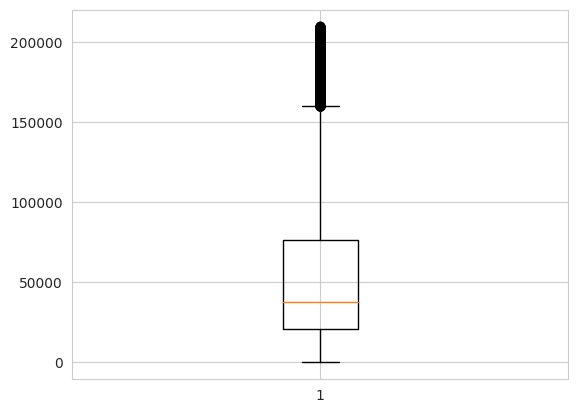

In [ ]:
plt.boxplot(data["Income"])

{'whiskers': [<matplotlib.lines.Line2D at 0x7df99e5b3c10>,
 'caps': [<matplotlib.lines.Line2D at 0x7df99c2cc190>,
 'boxes': [<matplotlib.lines.Line2D at 0x7df99e5b3970>],
 'medians': [<matplotlib.lines.Line2D at 0x7df99c2cc6d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7df99c2cc970>],
 'means': []}

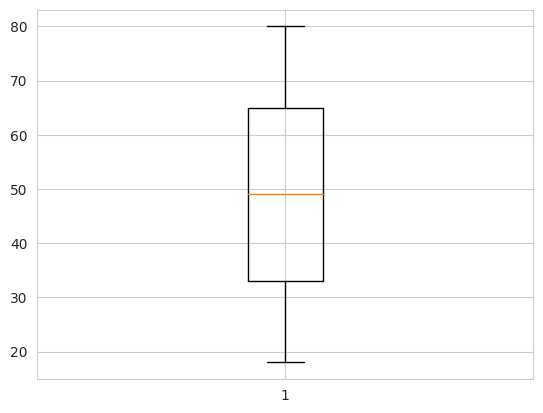

In [ ]:
plt.boxplot(data["Age"])

{'whiskers': [<matplotlib.lines.Line2D at 0x7df99c32b190>,
 'caps': [<matplotlib.lines.Line2D at 0x7df99c32b6d0>,
 'boxes': [<matplotlib.lines.Line2D at 0x7df99c32aef0>],
 'medians': [<matplotlib.lines.Line2D at 0x7df99c32bc10>],
 'fliers': [<matplotlib.lines.Line2D at 0x7df99c32beb0>],
 'means': []}

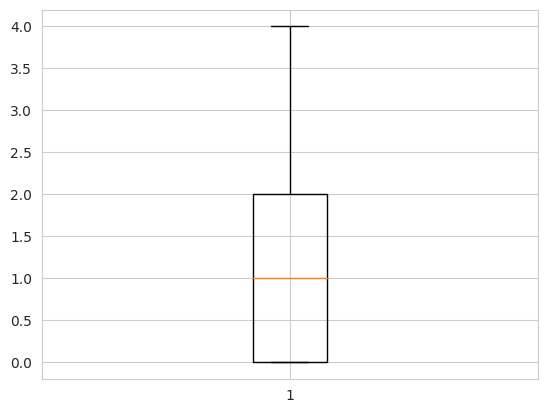

In [ ]:
plt.boxplot(data["Number of Children"])

<Axes: >

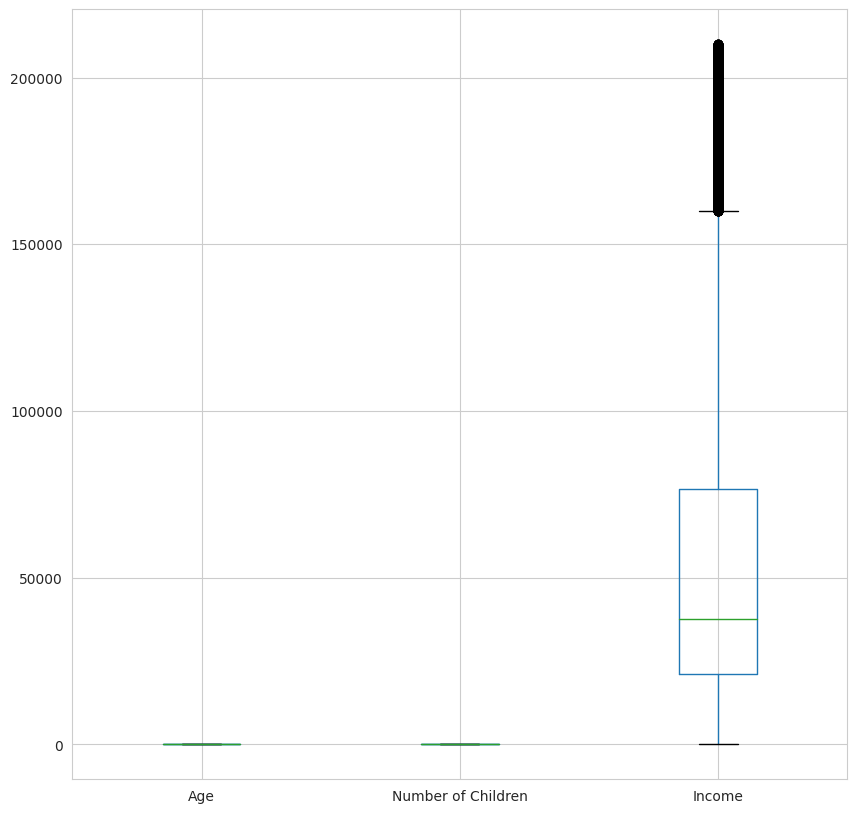

In [ ]:
data.boxplot(figsize=(10,10))

#### **Scatter Plot**

6.   striplot

<Axes: xlabel='History of Mental Illness', ylabel='Income'>

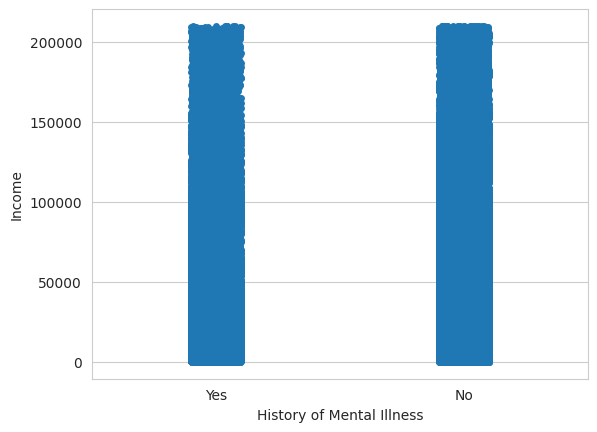

In [ ]:
sns.stripplot(x="History of Mental Illness", y="Income", data=data)

<Axes: xlabel='History of Mental Illness', ylabel='Income'>

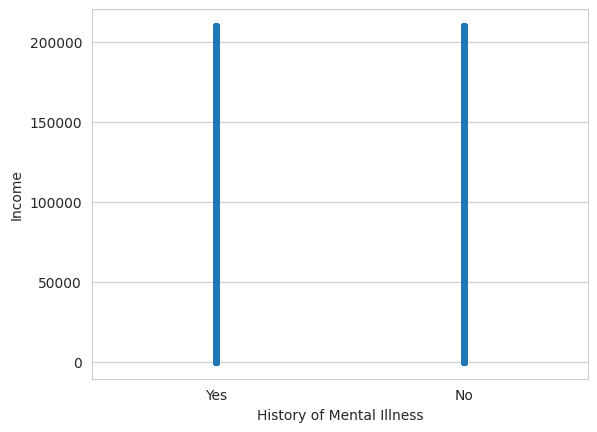

In [ ]:
sns.stripplot(x="History of Mental Illness", y="Income", data=data, jitter=False)

<Axes: xlabel='History of Mental Illness', ylabel='Income'>

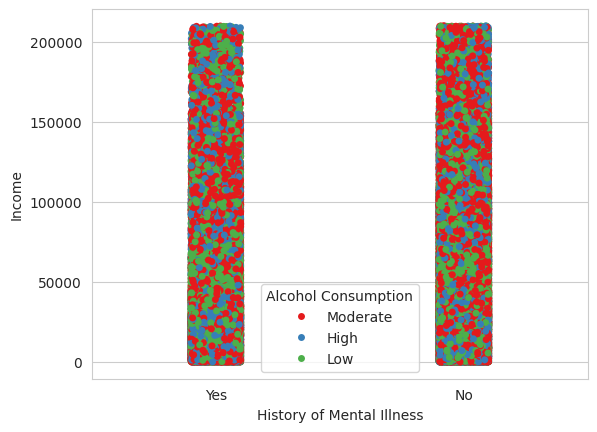

In [ ]:
sns.stripplot(x="History of Mental Illness", y="Income", hue='Alcohol Consumption', data=data, palette='Set1')

<Axes: xlabel='History of Mental Illness', ylabel='Income'>

/usr/local/lib/python3.10/dist-packages/IPython/core/events.py:89: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


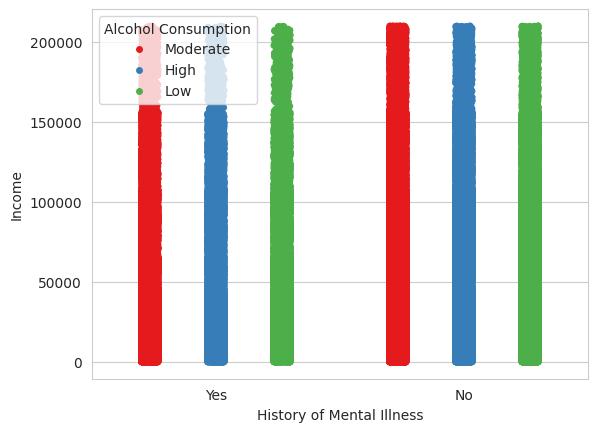

In [ ]:
sns.stripplot(x="History of Mental Illness", y="Income", hue='Alcohol Consumption', data=data, palette='Set1', dodge=True)

7.   relplot

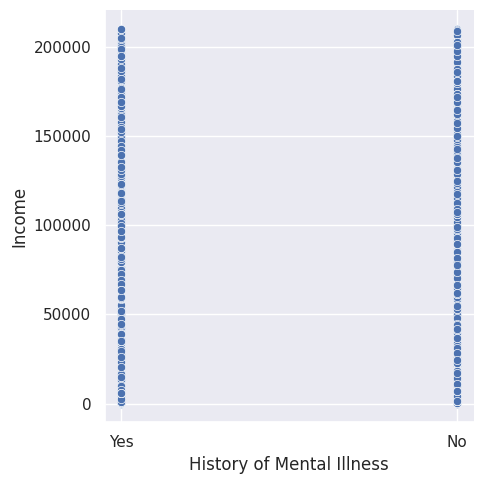

In [ ]:
sns.set(style="darkgrid")
sns.relplot(x="History of Mental Illness", y="Income", data=data);

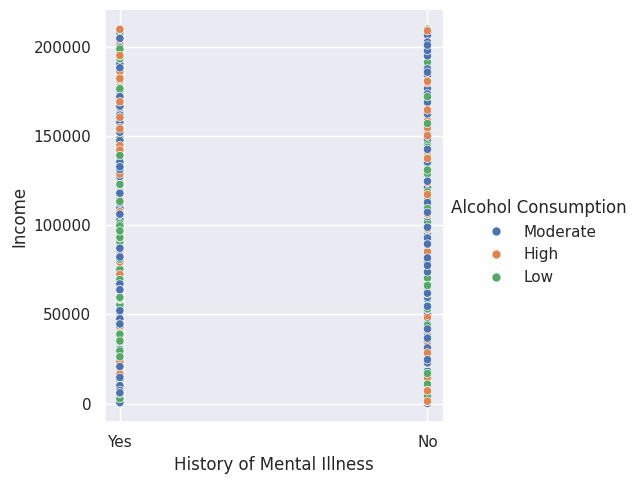

In [ ]:
sns.relplot(x="History of Mental Illness", y="Income", hue='Alcohol Consumption', data=data);

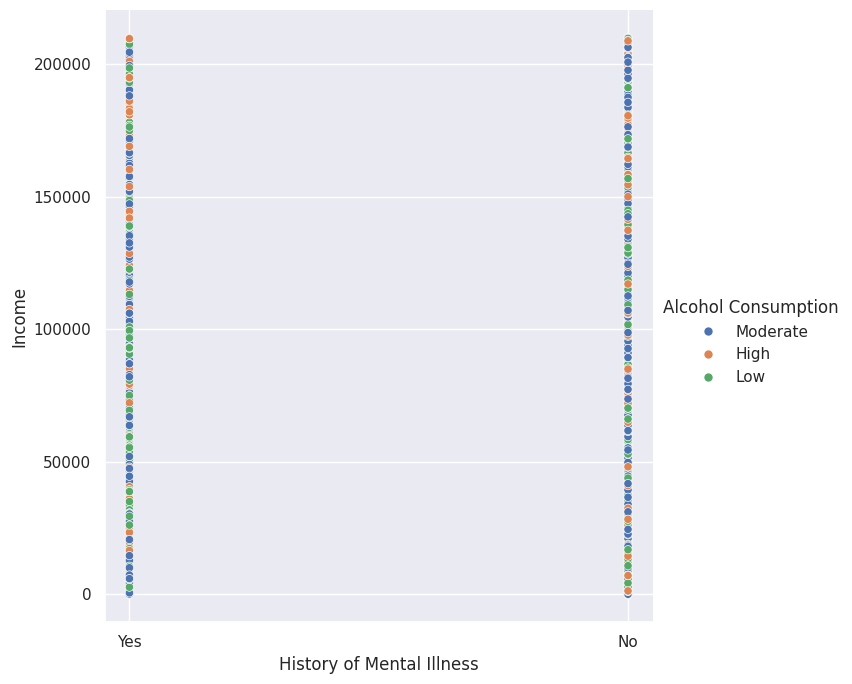

In [ ]:
sns.relplot(x="History of Mental Illness", y="Income", hue='Alcohol Consumption', height=7, data=data);

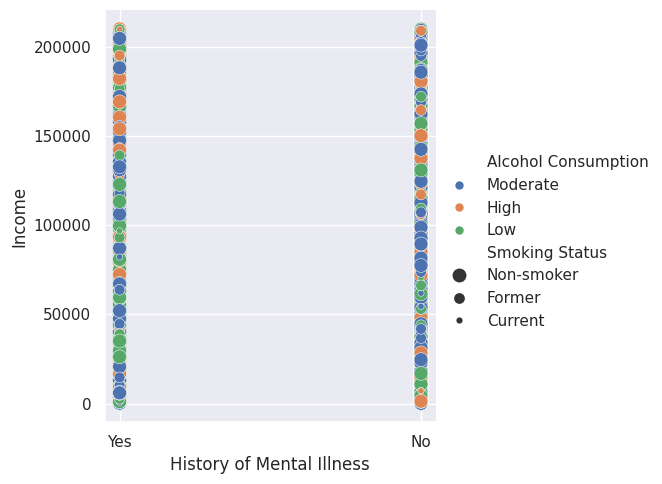

In [ ]:
sns.relplot(x="History of Mental Illness", y="Income", hue='Alcohol Consumption', size="Smoking Status", sizes=(20,100), data=data);

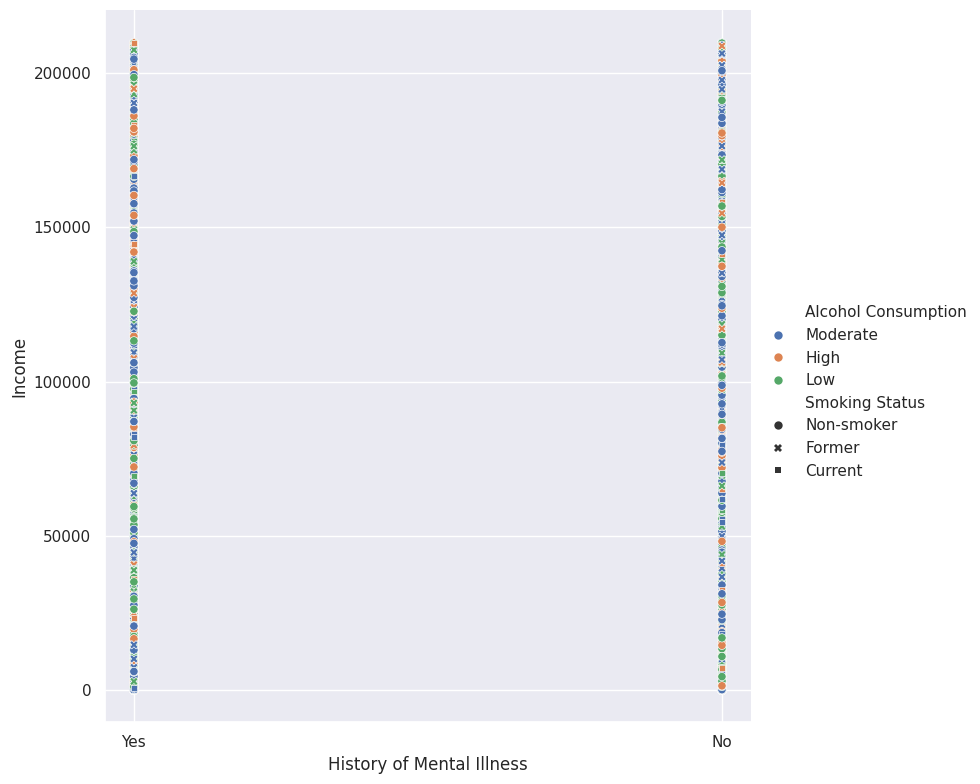

In [ ]:
sns.relplot(x="History of Mental Illness",
            y="Income",
            hue="Alcohol Consumption",
            style="Smoking Status",
            height=8,
            data=data);

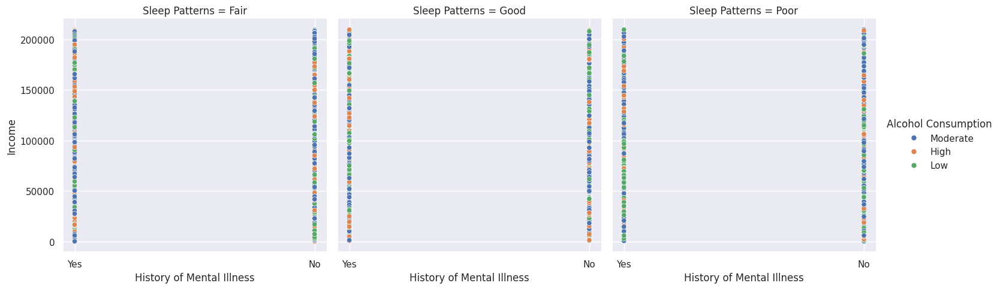

In [ ]:
sns.relplot(x="History of Mental Illness", y="Income", hue='Alcohol Consumption', col="Sleep Patterns", data=data);

In [ ]:
data['Income'].describe()


,Income
count,413768.000000
mean,50661.707971
std,40624.100565
min,0.410000
25%,21001.030000
50%,37520.135000
75%,76616.300000
max,209995.220000


8.   scatterplot

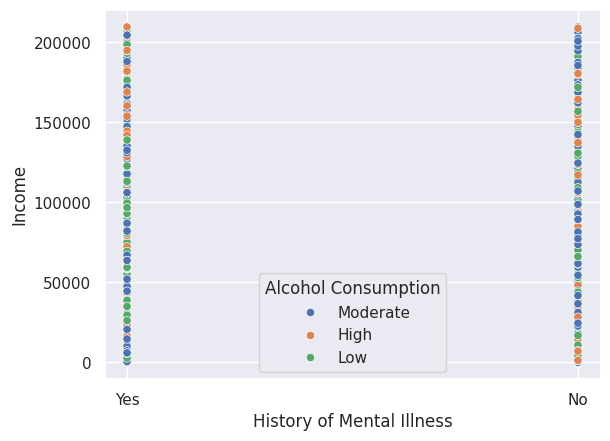

In [ ]:
sns.scatterplot(x="History of Mental Illness", y="Income", hue='Alcohol Consumption', data=data);

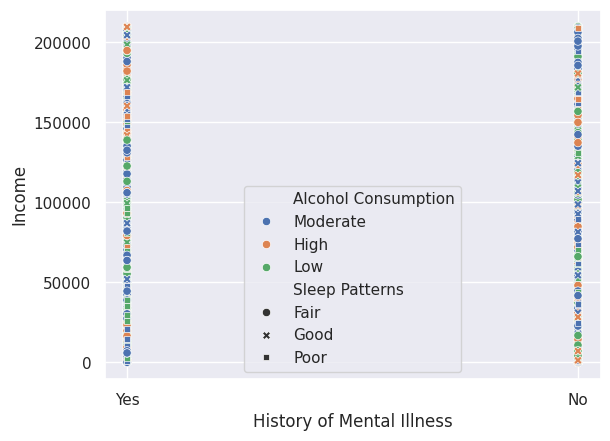

In [ ]:
sns.scatterplot(x="History of Mental Illness", y="Income", hue='Alcohol Consumption', style="Sleep Patterns", data=data);

10.   catplot

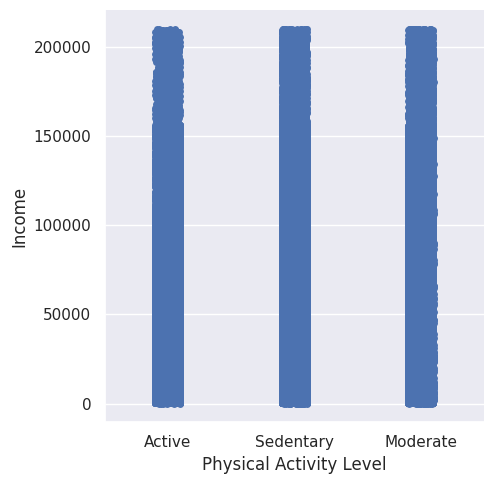

In [ ]:
sns.catplot(x="Physical Activity Level", y="Income", data=data);

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  self._figure.tight_layout(*args, **kwargs)


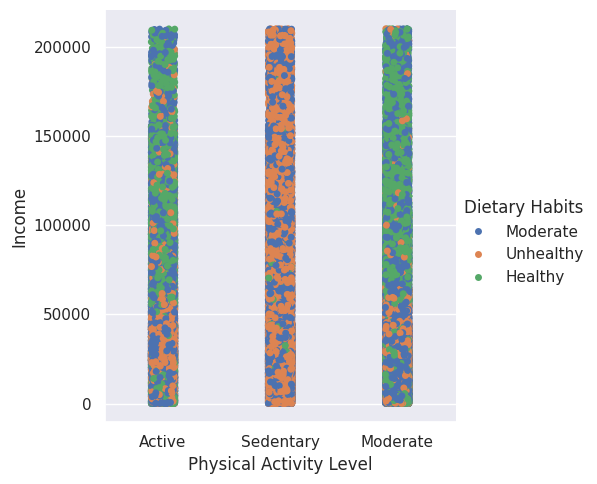

In [ ]:
sns.catplot(x="Physical Activity Level", y="Income",  hue="Dietary Habits", data=data);

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  self._figure.tight_layout(*args, **kwargs)


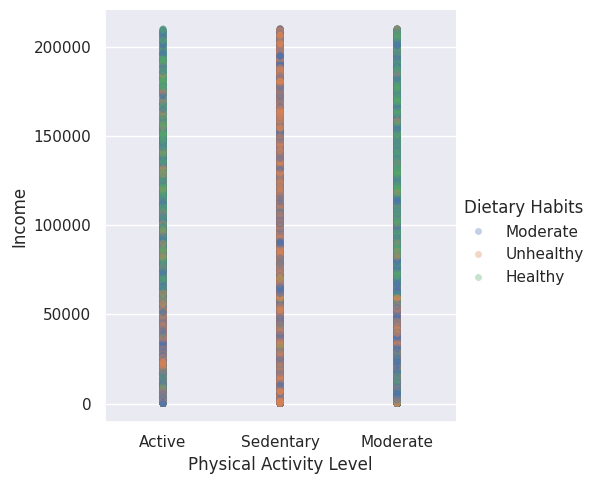

In [ ]:
sns.catplot(x="Physical Activity Level", y="Income",  hue="Dietary Habits", jitter=False, alpha=.33, data=data);

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  self._figure.tight_layout(*args, **kwargs)


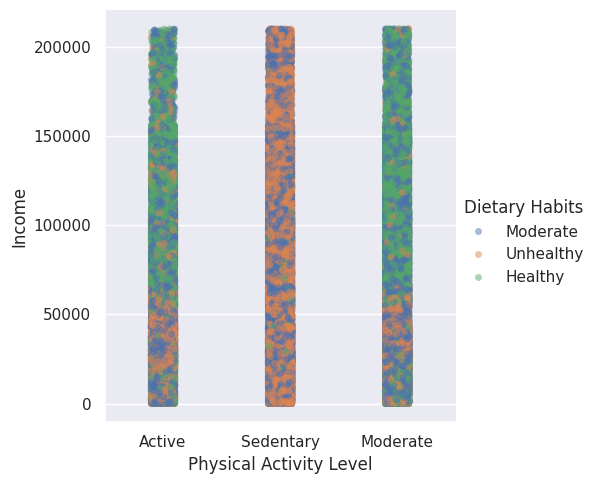

In [ ]:
sns.catplot(x="Physical Activity Level", y="Income",  hue="Dietary Habits", alpha=.5, data=data);

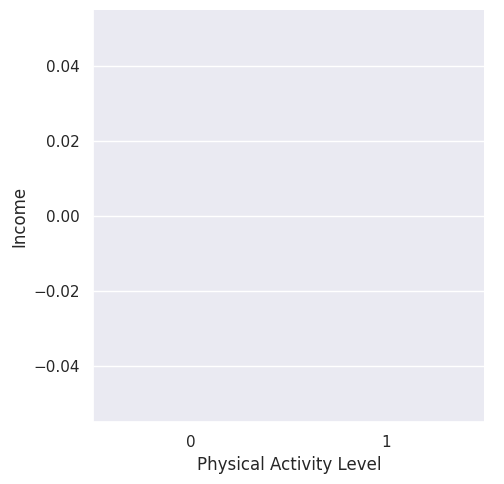

In [ ]:
sns.catplot(x="Physical Activity Level", y="Income", order = ["0", "1"], data=data);

/usr/local/lib/python3.10/dist-packages/seaborn/axisgrid.py:123: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  self._figure.tight_layout(*args, **kwargs)


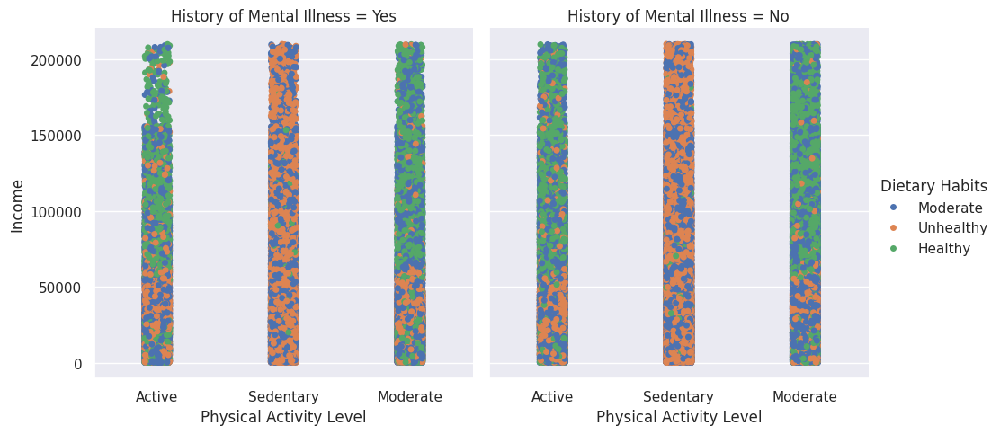

In [ ]:
sns.catplot(x="Physical Activity Level", y="Income",  hue="Dietary Habits", col="History of Mental Illness", data=data);

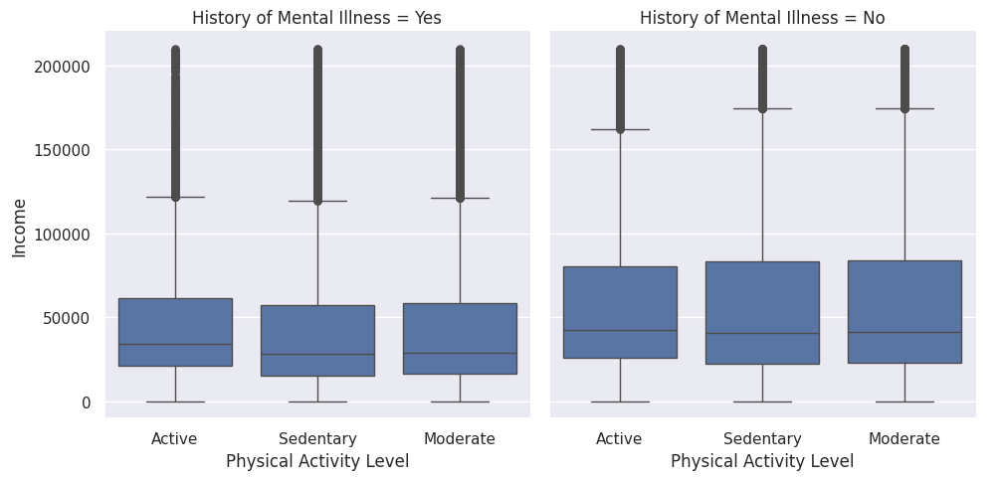

In [ ]:
sns.catplot(x="Physical Activity Level", y="Income", col="History of Mental Illness", kind="box", data=data);

#### **Line Plot**

9.   lineplot

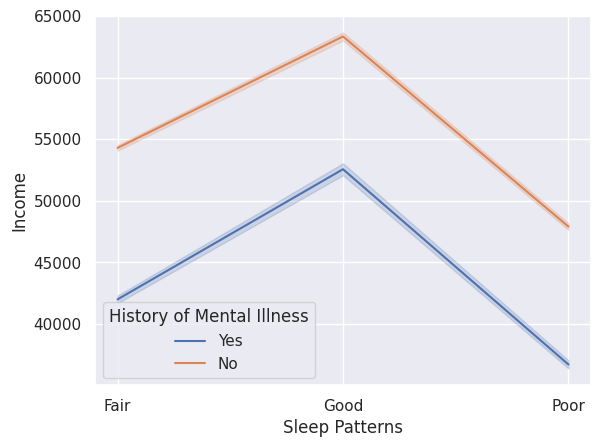

In [ ]:
sns.lineplot(x="Sleep Patterns", y="Income", hue="History of Mental Illness", data=data);

#### **Histogram**

11.   displot

<ipython-input-65-996c691f1755>:2: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['Income'])


<Axes: xlabel='Income', ylabel='Density'>

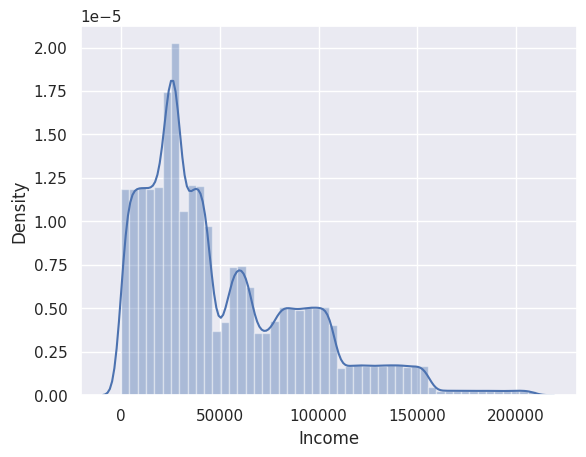

In [ ]:
# displot berbentuk histogram dan ada tambahan garis
sns.distplot(data['Income'])

<ipython-input-66-d1901d7d2ffd>:5: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data['Income'], kde=False, bins=10)


<Axes: xlabel='Income'>

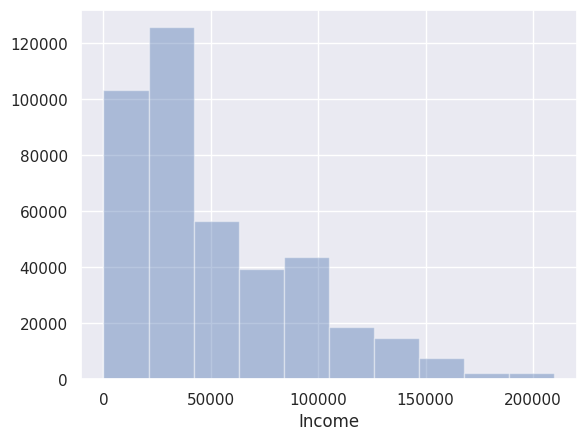

In [ ]:
# jika ingin tidak ada garis
# membatasi jumlah yg tampil dapat menggunakan bins
# kde=False itu artinya menghilangkan garis tersebut

sns.distplot(data['Income'], kde=False, bins=10)

12.   jointplot

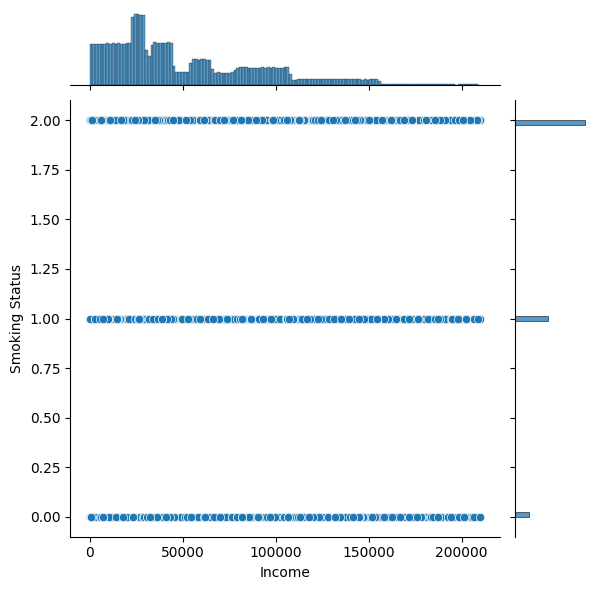

In [ ]:
# vjoin plot (menggabungkan plot)
# yg titik titik merupakan data scatter
# yg bar adalah histogram

sns.jointplot(x='Income', y='Smoking Status', data=data, kind='scatter')

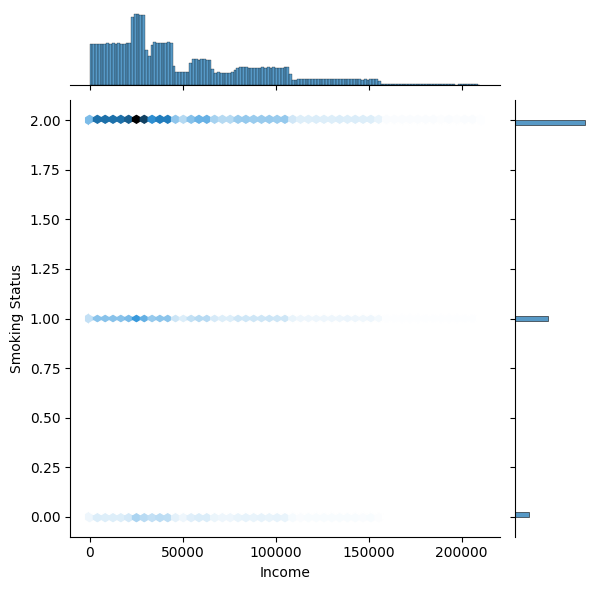

In [ ]:
sns.jointplot(x='Income', y='Smoking Status', data=data, kind='hex')

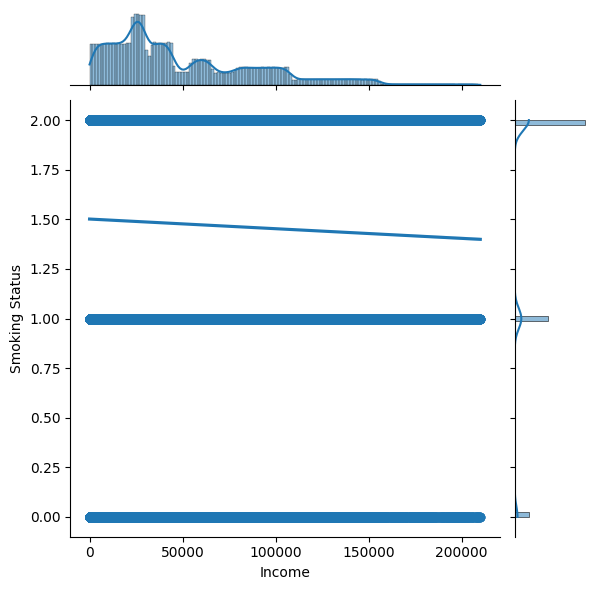

In [ ]:
#reg itu regresion, dia akan tampak ada garisnya ada scatternya

sns.jointplot(x='Income', y='Smoking Status', data=data, kind='reg')

#### **Heatmap (Correlation)**

13.   heatmap


<Axes: >

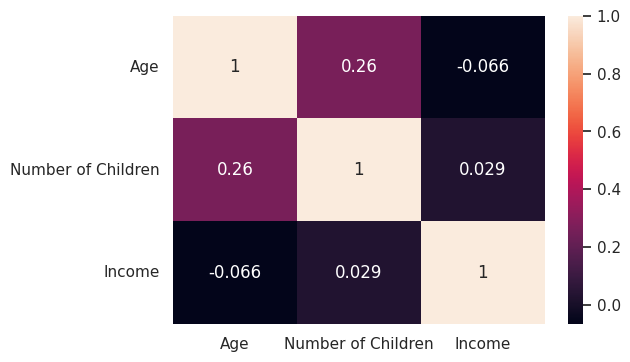

In [ ]:
# heatmap correlation
plt.subplots(figsize=(6,4))
sns.heatmap(num_columns.corr(), annot=True)

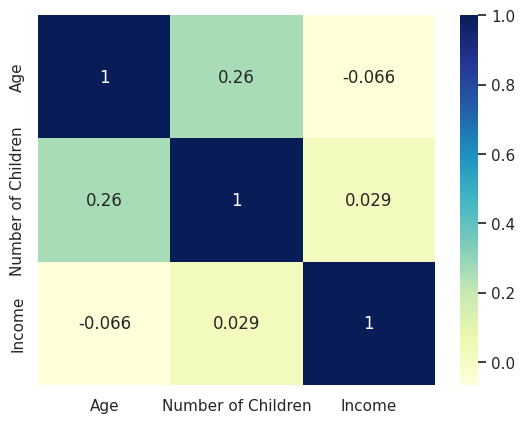

In [ ]:
# plotting correlation heatmap
dataplot = sns.heatmap(num_columns.corr(), cmap="YlGnBu", annot=True)

# displaying heatmap
plt.show()

**Hubungan**

*   +0.90 to 1 atau (-0.90 to 1) : korelasi positif (negatif) yang sangat tinggi
*   +0.70 to +0.89 atau (-0.70 to -0.89) : korelasi positif (negatif) yang tinggi
*   +0.50 to +0.69 atau (-0.50 to -0.69) : korelasi sedang positif (negatif)
*   +0.30 to +0.49 atau (-0.30 to -0.49) : korelasi positif (negatif) yang rendah
*   0.00 to +0.29 atau (0.00 to -0.29) : korelasi positif (negatif) yang sangat rendah


**Hubungan**

*   +0.10 to 1atau -0.10 : ada sedikit hubungan (jika ada)
antara dua variabel
*   +0.90 atau -0.90 : terdapat hubungan yang kuat
*   +1.0 : positif sempurna
*   -1.0 : negatif sempurna
*   0 : tidak ada korelasi atau hubungan antara kedua
variable

`-0.1 < -0.09 < -0.01 < -0.001 < **0** < 0.001 < 0.01 < 0.1 < 0.9 < 1`

#### **Pie Chart**

14.   pie chart

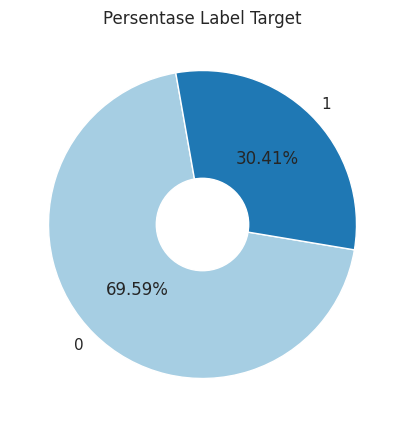

In [ ]:
plt.figure(figsize=(5, 5))
plt.pie(data['History of Mental Illness'].value_counts(), labels=['0', '1'], colors=plt.cm.Paired.colors,
        autopct='%2.2f%%', startangle=100, wedgeprops=dict(width=0.8))
plt.gca().add_artist(plt.Circle((0,0),0.30,fc='white'))
plt.title('Persentase Label Target')
plt.show()

### **Data Preprocessing**

#### **Data Cleaning**

In [ ]:
# # replace 1 and 0 in HeartDisease into heart disease and normal
# data['HeartDisease'] = data['HeartDisease'].apply(lambda x: 'heart disease' if x == 1 else 'normal')

# # jumlah data berdasarkan label/kelas target
# data.groupby('HeartDisease').size()

In [ ]:
# # salah satu teknik cleaning data (memperbaiki inkonsistensi data)
# data['atribut'] = np.where(data['atribut']=='No internet service','No', data['atribut'])

In [ ]:
# # salah satu teknik cleaning data (mengisi nilai yang kosong)
# data['TotalCharges'].fillna(value=data['tenure'] * data['MonthlyCharges'], inplace=True)

In [ ]:
# # replace missing values with the median
# data.fillna(data.median(), inplace=True)

In [ ]:
# # atau dapat dilakukan teknik cleaning data dengan menghapus data yang kosong
# data.dropna(inplace=True)

In [ ]:
# # teknik cleaning data (mengisi dengan konstanta global), masing-masing missing value akan diganti dengan '..' (cell kosong)
# data['atribut'] = np.where(data['atribut']=='NaN','', data['atribut'])

In [ ]:
# # atau masing-masing nilai missing value akan diganti dengan 0
# data['atribut'].fillna(0, inplace=True)

In [ ]:
# # merubah type data object menjadi float
# data['atribut'] = pd.to_numeric(data['atribut'], errors='coerce')

In [ ]:
# # contoh untuk mengganti nilai outlier jika terdapat outlier
# df['title_year'] = np.where(df['title_year']=="202","2002", df['title_year'])

# # cara menghapus outlier dengan metode IQR
# # keterangan 'PTRATIO' itu nama kolom
# Q1 = np.percentile(df_boston['PTRATIO'], 25, interpolation = 'midpoint')
# Q3 = np.percentile(df_boston['PTRATIO'], 75, interpolation = 'midpoint')

# IQR = Q3 - Q1
# print(IQR)

# # upper bound
# upper = np.where(df_boston['PTRATIO'] >= (Q3+1.5*IQR))

# # lower bound
# lower = np.where(df_boston['PTRATIO'] <= (Q1-1.5*IQR))

# print("upper bound:" , upper)
# print(np.where(upper))

# print("lower bound:" , lower)
# print(np.where(lower))

# # menghilangkan outlier
# df_boston.drop(upper[0], inplace = True)
# df_boston.drop(lower[0], inplace = True)

# # visualisasikan boxplot pada saat outler sudah dihapus
# sns.boxplot(df_boston['PTRATIO'])

#### **Data Transformation (Feature Engineering)**

In [ ]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [ ]:
# # inisialisasi LabelEncoder
# le = LabelEncoder()

# # features bertipe object yang akan di-encode
# f_objek = data.select_dtypes(include=['object']).columns

# # looping untuk encode setiap kolom bertipe object
# for kolom in f_objek:
#   data[kolom + '_encoded'] = le.fit_transform(data[kolom])

In [ ]:
# # mengecek hasil label encoding untuk setiap kolom
# for kolom in f_objek:
#   le.fit(data[kolom])  # fit ulang untuk mendapatkan kelas asli
#   print(f"\nMapping untuk kolom {kolom}:")
#   mapping = dict(zip(le.classes_, le.transform(le.classes_)))
#   print(mapping)


Mapping untuk kolom Name:
{'Aaron Adams': 0, 'Aaron Aguilar': 1, 'Aaron Aguirre': 2, 'Aaron Alexander': 3, 'Aaron Alexander DDS': 4, 'Aaron Ali': 5, 'Aaron Allen': 6, 'Aaron Allison': 7, 'Aaron Alvarez': 8, 'Aaron Andersen': 9, 'Aaron Anderson': 10, 'Aaron Andrade': 11, 'Aaron Andrews': 12, 'Aaron Anthony PhD': 13, 'Aaron Archer': 14, 'Aaron Arias': 15, 'Aaron Armstrong': 16, 'Aaron Arnold': 17, 'Aaron Arroyo': 18, 'Aaron Ashley': 19, 'Aaron Atkins': 20, 'Aaron Avery': 21, 'Aaron Bailey': 22, 'Aaron Baker': 23, 'Aaron Baldwin': 24, 'Aaron Ball': 25, 'Aaron Ballard': 26, 'Aaron Ballard MD': 27, 'Aaron Banks': 28, 'Aaron Barajas': 29, 'Aaron Barber': 30, 'Aaron Barnes': 31, 'Aaron Barnett': 32, 'Aaron Barrera': 33, 'Aaron Barrett': 34, 'Aaron Barton': 35, 'Aaron Bates': 36, 'Aaron Beard': 37, 'Aaron Beck': 38, 'Aaron Becker': 39, 'Aaron Bell': 40, 'Aaron Benitez': 41, 'Aaron Bennett': 42, 'Aaron Benson': 43, 'Aaron Bernard': 44, 'Aaron Berry': 45, 'Aaron Black': 46, 'Aaron Blackburn': 4

In [ ]:
# Check if the column name exists in your DataFrame
print(data.columns)

Index(['Name', 'Age', 'Marital Status', 'Education Level',
       'Number of Children', 'Smoking Status', 'Physical Activity Level',
       'Employment Status', 'Income', 'Alcohol Consumption', 'Dietary Habits',
       'Sleep Patterns', 'History of Mental Illness',
       'History of Substance Abuse', 'Family History of Depression',
       'Chronic Medical Conditions'],
      dtype='object')


In [ ]:
# transformasi data (feature engineering) dari kategorikal string menjadi kategorikal numerik
le = LabelEncoder()
data['Marital Status'] = le.fit_transform(data['Marital Status'])
data['Education Level'] = le.fit_transform(data['Education Level'])
data['Smoking Status'] = le.fit_transform(data['Smoking Status'])
data['Physical Activity Level'] = le.fit_transform(data['Physical Activity Level'])
data['Employment Status'] = le.fit_transform(data['Employment Status'])
data['Alcohol Consumption'] = le.fit_transform(data['Alcohol Consumption'])
data['Dietary Habits'] = le.fit_transform(data['Dietary Habits'])
data['Sleep Patterns'] = le.fit_transform(data['Sleep Patterns'])
data['History of Mental Illness'] = le.fit_transform(data['History of Mental Illness'])

print('unique data feature Marital Status : ', data['Marital Status'].unique())
print('unique data feature Education Level : ', data['Education Level'].unique())
print('unique data feature Smoking Status : ', data['Smoking Status'].unique())
print('unique data feature Physical Activity Level : ', data['Physical Activity Level'].unique())
print('unique data feature Employment Status : ', data['Employment Status'].unique())
print('unique data feature Alcohol Consumption : ', data['Alcohol Consumption'].unique())
print('unique data feature Sleep Patterns : ', data['Sleep Patterns'].unique())
print('unique data feature History of Mental Illness : ', data['History of Mental Illness'].unique())


unique data feature Marital Status :  [1 3 0 2]
unique data feature Education Level :  [1 2 3 0 4]
unique data feature Smoking Status :  [2 1 0]
unique data feature Physical Activity Level :  [0 2 1]
unique data feature Employment Status :  [1 0]
unique data feature Alcohol Consumption :  [2 0 1]
unique data feature Sleep Patterns :  [0 1 2]
unique data feature History of Mental Illness :  [1 0]


#### **Feature Selection (Dimenstion Reduction)**

In [ ]:
# cek nama-nama features
data.columns

Index(['Name', 'Age', 'Marital Status', 'Education Level',
       'Number of Children', 'Smoking Status', 'Physical Activity Level',
       'Employment Status', 'Income', 'Alcohol Consumption', 'Dietary Habits',
       'Sleep Patterns', 'History of Mental Illness',
       'History of Substance Abuse', 'Family History of Depression',
       'Chronic Medical Conditions'],
      dtype='object')

In [ ]:
# teknik data preprocssing (feature selection) yaitu menghapus features yang tidak digunakan
data.drop(['Name'], axis=1, inplace=True)
data.drop(['History of Substance Abuse'], axis=1, inplace=True)
data.drop(['Family History of Depression'], axis=1, inplace=True)
data.drop(['Chronic Medical Conditions'], axis=1, inplace=True)

In [ ]:
data.head()

,Age,Marital Status,Education Level,Number of Children,Smoking Status,Physical Activity Level,Employment Status,Income,Alcohol Consumption,Dietary Habits,Sleep Patterns,History of Mental Illness
0,31,1,1,2,2,0,1,26265.67,2,1,0,1
1,55,1,2,1,2,2,0,42710.36,0,2,0,1
2,78,3,3,1,2,2,0,125332.79,1,2,1,0
3,58,0,3,3,2,1,1,9992.78,2,1,2,0
4,18,2,2,0,2,2,1,8595.08,1,1,0,1


In [ ]:
# # memindahkan feature HeartDisease kolom ke-3 (index 2) ke posisi terakhir
# target_column = data.pop(data.columns[2])
# data['History of Mental Illness'] = target_column

# # dataFrame yang sudah diperbarui
# print(data)

In [ ]:
# cek dimensi data (banyaknya data dan features)
data.shape

(413768, 12)

#### **Menghapus Data Duplikat**

In [ ]:
# cek data duplikat
data.duplicated().sum()

0

In [ ]:
# hapus data duplikat (cleaning data) dan cek kembali
data.drop_duplicates(inplace=True)
data.duplicated().sum()

0

In [ ]:
# mengecek dimensi data
data.shape

(413768, 12)

#### **Pembagian Data**

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 413768 entries, 0 to 413767
Data columns (total 12 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Age                        413768 non-null  int64  
 1   Marital Status             413768 non-null  int64  
 2   Education Level            413768 non-null  int64  
 3   Number of Children         413768 non-null  int64  
 4   Smoking Status             413768 non-null  int64  
 5   Physical Activity Level    413768 non-null  int64  
 6   Employment Status          413768 non-null  int64  
 7   Income                     413768 non-null  float64
 8   Alcohol Consumption        413768 non-null  int64  
 9   Dietary Habits             413768 non-null  int64  
 10  Sleep Patterns             413768 non-null  int64  
 11  History of Mental Illness  413768 non-null  int64  
dtypes: float64(1), int64(11)
memory usage: 37.9 MB


In [ ]:
# distributing the dataset into two components X and Y
y = data['History of Mental Illness'].values
X = data.drop(columns = ['History of Mental Illness'])

In [ ]:
# Import the necessary function from the correct module
from sklearn.model_selection import train_test_split
# splitting the dataset into the data training and data testing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [ ]:
print('dimensi data X_train: ', X_train.shape)
print('dimensi data X_test: ', X_test.shape)
print('dimensi data y_train: ', y_train.shape)
print('dimensi data y_test: ', y_test.shape)

dimensi data X_train:  (331014, 11)
dimensi data X_test:  (82754, 11)
dimensi data y_train:  (331014,)
dimensi data y_test:  (82754,)


#### **Feature Transformation (Feature Scalling)**

In [ ]:
# Feature Scaling (normalisasi data) dengan menggunakan fungsi StandardScaler atau MinMaxScaller
# Melakukan bagian preprocessing pada data training dan data testing seperti menyesuaikan skala Standar(normalisasi)
# StandarScaler: standarisasi feature dengan menghapus rata-rata dan penskalaan ke unit variance.
# MinMaxScaller: Ubah fitur dengan menskalakan setiap fitur ke rentang tertentu (antara 0 dan 1).

# Import MinMaxScaler
from sklearn.preprocessing import MinMaxScaler # Import the MinMaxScaler class

sc = MinMaxScaler()
X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.transform(X_test)

In [ ]:
# # normalise the amount column
# data['normAmount'] = StandardScaler().fit_transform(np.array(data['Amount']).reshape(-1, 1))

#### **PCA**

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.decomposition import PCA
from matplotlib.colors import ListedColormap

In [ ]:
# menghitung akurasi model tanpa PCA
# training model menggunakan algoritma Logistic Regression dengan data latih (X_train dan y_train)
model_satu = LogisticRegression(max_iter=1000)
model_satu.fit(X_train, y_train)

# evaluasi model mengguanakan data uji (X_test dan y_test)
model_satu.score(X_test, y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.6944800251347367

In [ ]:
# membuat objek PCA dengan 6 principal component
pca = PCA(n_components=6)

# mengaplikasikan PCA pada input model data latih
pca_attributes = pca.fit_transform(X_train)

# melihat variance dari setiap atribut
pca.explained_variance_ratio_

array([9.99999798e-01, 1.98451850e-07, 9.08306070e-10, 6.93430781e-10,
       4.53727533e-10, 4.26919705e-10])

In [ ]:
# PCA dengan 2 principal component
pca = PCA(n_components=2)

X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.fit_transform(X_test)

# training model
model_dua = LogisticRegression(max_iter=1000)
model_dua.fit(X_train_pca, y_train)

# evaluasi model
model_dua.score(X_test_pca, y_test)

0.6944800251347367

ValueError: 'yellow' is not a valid color value.

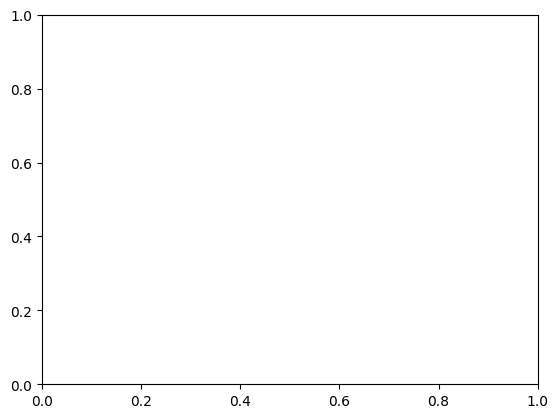

In [ ]:
# training set
# hasil melalui scatter plot

X_set, y_set = X_train_pca, y_train
X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = 10),
                     np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = 10))

plt.contourf(X1, X2, model_dua.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape),
             alpha = 0.75, cmap = ListedColormap(('yellow', 'aquamarine')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(y_set)):
	plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
	            c = ListedColormap(('red', 'green'))(i), label = j)

plt.title('Logistic Regression (Training set)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()

# show scatter plot
plt.show()


ValueError: 'yellow' is not a valid color value.

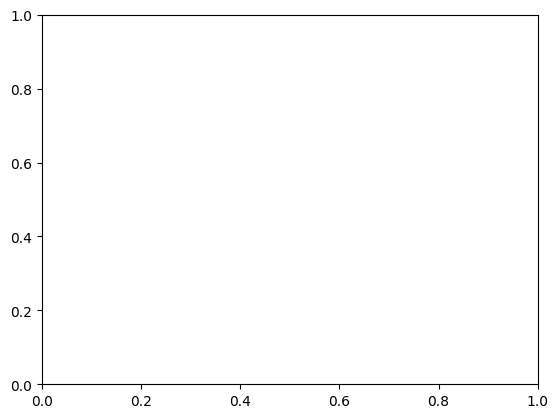

In [ ]:
# visualizing the Test set results

X_set, y_set = X_test_pca, y_test

X1, X2 = np.meshgrid(np.arange(start = X_set[:, 0].min() - 1, stop = X_set[:, 0].max() + 1, step = 10),
                     np.arange(start = X_set[:, 1].min() - 1, stop = X_set[:, 1].max() + 1, step = 10))

plt.contourf(X1, X2, model_dua.predict(np.array([X1.ravel(), X2.ravel()]).T).reshape(X1.shape),
             alpha = 0.75, cmap = ListedColormap(('yellow', 'aquamarine')))

plt.xlim(X1.min(), X1.max())
plt.ylim(X2.min(), X2.max())

for i, j in enumerate(np.unique(y_set)):
	plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
				c = ListedColormap(('red', 'green'))(i), label = j)

plt.title('Logistic Regression (Test set)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.legend()

# show scatter plot
plt.show()

In [ ]:
## program untuk PCA 4 componen

# # Ubah X_set agar hanya mengambil 2 komponen pertama (PC1 dan PC2) untuk visualisasi
# X_set, y_set = X_train_pca[:, :2], y_train  # Ambil PC1 dan PC2

# # # ika ingin melihat komponen lain, misalnya PC3 dan PC4
# # X_set, y_set = X_train_pca[:, 2:4], y_train  # Ambil PC3 dan PC4

# # Membuat meshgrid untuk PC1 dan PC2
# X1, X2 = np.meshgrid(np.arange(start=X_set[:, 0].min() - 1, stop=X_set[:, 0].max() + 1, step=0.01),
#                      np.arange(start=X_set[:, 1].min() - 1, stop=X_set[:, 1].max() + 1, step=0.01))

# # Karena model dilatih dengan 4 komponen, kita perlu menambahkan nilai untuk PC3 dan PC4.
# # Di sini kita asumsikan nilai rata-rata atau nilai tetap (misalnya 0) untuk PC3 dan PC4
# PC3 = np.zeros(X1.ravel().shape)  # Misalkan PC3 kita isi dengan 0
# PC4 = np.zeros(X1.ravel().shape)  # Misalkan PC4 kita isi dengan 0

# # Gabungkan semua komponen (PC1, PC2, PC3, PC4)
# X_grid = np.array([X1.ravel(), X2.ravel(), PC3, PC4]).T

# # Plot decision boundary menggunakan model yang telah dilatih
# plt.contourf(X1, X2, model_dua.predict(X_grid).reshape(X1.shape), alpha=0.75, cmap=ListedColormap(('yellow', 'aquamarine')))

# # Set batas sumbu x dan y
# plt.xlim(X1.min(), X1.max())
# plt.ylim(X2.min(), X2.max())

# # Scatter plot untuk tiap kategori pada y_set
# for i, j in enumerate(np.unique(y_set)):
#     plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
#                 c=ListedColormap(('red', 'green'))(i), label=j)

# # Menambahkan judul dan label sumbu
# plt.title('Logistic Regression (Training set)')
# plt.xlabel('PC1')  # Komponen utama 1
# plt.ylabel('PC2')  # Komponen utama 2
# plt.legend()

# # Tampilkan scatter plot
# plt.show()

In [ ]:
## program untuk PCA 4 componen

# # Ubah X_set agar hanya mengambil 2 komponen pertama (PC1 dan PC2) untuk visualisasi
# X_set, y_set = X_test_pca[:, :2], y_test  # Ambil PC1 dan PC2

# # # ika ingin melihat komponen lain, misalnya PC3 dan PC4
# # X_set, y_set = X_train_pca[:, 2:4], y_train  # Ambil PC3 dan PC4

# # Membuat meshgrid untuk PC1 dan PC2
# X1, X2 = np.meshgrid(np.arange(start=X_set[:, 0].min() - 1, stop=X_set[:, 0].max() + 1, step=0.01),
#                      np.arange(start=X_set[:, 1].min() - 1, stop=X_set[:, 1].max() + 1, step=0.01))

# # Karena model dilatih dengan 4 komponen, kita perlu menambahkan nilai untuk PC3 dan PC4.
# # Di sini kita asumsikan nilai rata-rata atau nilai tetap (misalnya 0) untuk PC3 dan PC4
# PC3 = np.zeros(X1.ravel().shape)  # Misalkan PC3 kita isi dengan 0
# PC4 = np.zeros(X1.ravel().shape)  # Misalkan PC4 kita isi dengan 0

# # Gabungkan semua komponen (PC1, PC2, PC3, PC4)
# X_grid = np.array([X1.ravel(), X2.ravel(), PC3, PC4]).T

# # Plot decision boundary menggunakan model yang telah dilatih
# plt.contourf(X1, X2, model_dua.predict(X_grid).reshape(X1.shape), alpha=0.75, cmap=ListedColormap(('yellow', 'aquamarine')))

# # Set batas sumbu x dan y
# plt.xlim(X1.min(), X1.max())
# plt.ylim(X2.min(), X2.max())

# # Scatter plot untuk tiap kategori pada y_set
# for i, j in enumerate(np.unique(y_set)):
#     plt.scatter(X_set[y_set == j, 0], X_set[y_set == j, 1],
#                 c=ListedColormap(('red', 'green'))(i), label=j)

# # Menambahkan judul dan label sumbu
# plt.title('Logistic Regression (Training set)')
# plt.xlabel('PC1')  # Komponen utama 1
# plt.ylabel('PC2')  # Komponen utama 2
# plt.legend()

# # Tampilkan scatter plot
# plt.show()

install seaborn di visual code:
*   Open the terminal by selecting View > Terminal from the menu bar, or by pressing the Ctrl+` keyboard shortcut.
*   pastikan bahwa environment tersebut aktif saat menjalankan perintah instalasi: .\env\Scripts\activate
*   kemudian, install Seaborn di environment yang aktif: pip install seaborn

SMOTE

### **Imbalance Data Distribution**

In [ ]:
# cek distribusi data
print('dimensi data y_train: ', y_train.shape)
print('dimensi data train_X: {}'.format(X_train_sc.shape))
print("Before, counts of label no: {}".format(sum(y_train == 0)))
print("Before, counts of label yes: {}".format(sum(y_train == 1)))

dimensi data y_train:  (331014,)
dimensi data train_X: (331014, 11)
Before, counts of label no: 230472
Before, counts of label yes: 100542


#### **SMOTE**

In [ ]:
from imblearn.over_sampling import SMOTE

smote = SMOTE()
X_train_smote, y_train_smote = smote.fit_resample(X_train_sc, y_train)

In [ ]:
print('After SMOTE, the shape of y_train: ', y_train_smote.shape)
print('After SMOTE, the shape of train_X: {}'.format(X_train_smote.shape))
print("After SMOTE, counts of label 'no': {}".format(sum(y_train_smote == 0)))
print("After SMOTE, counts of label 'yes': {}".format(sum(y_train_smote == 1)))

After SMOTE, the shape of y_train:  (460944,)
After SMOTE, the shape of train_X: (460944, 11)
After SMOTE, counts of label 'no': 230472
After SMOTE, counts of label 'yes': 230472


#### **Near Miss**

In [ ]:
from imblearn.under_sampling import NearMiss

nm = NearMiss()
X_train_miss, y_train_miss = nm.fit_resample(X_train_sc, y_train)

In [ ]:
print('After Near Miss, the shape of y_train: ', y_train_miss.shape)
print('After Near Miss, the shape of train_X: {}'.format(X_train_miss.shape))
print("After Near Miss, the shape of label 'no': {}".format(sum(y_train_miss == 0)))
print("After Near Miss, the shape of label 'yes': {}".format(sum(y_train_miss == 1)))

After Near Miss, the shape of y_train:  (201084,)
After Near Miss, the shape of train_X: (201084, 11)
After Near Miss, the shape of label 'no': 100542
After Near Miss, the shape of label 'yes': 100542


### **KNN**

#### **KNN tanpa Normalization**

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import neighbors
from sklearn.metrics import accuracy_score, classification_report

Text(0, 0.5, 'Error rata-rata')

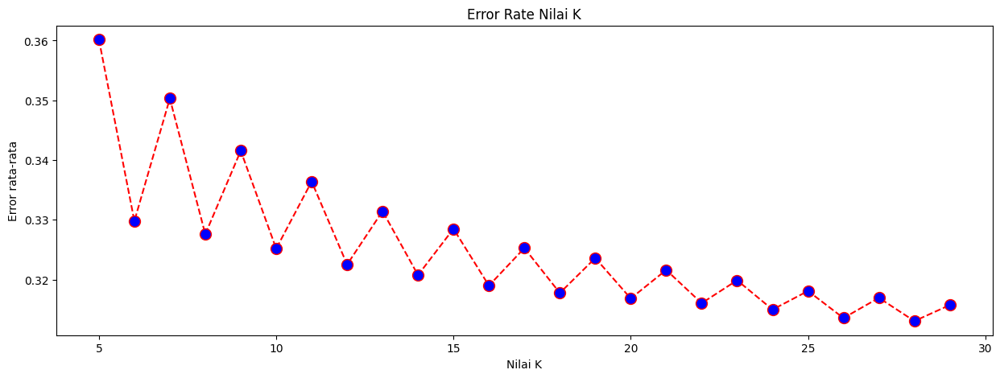

In [ ]:
error = []

# menghitung kesalahan untuk nilai K antara 5 dan 30
for i in range(5, 30):
  knn = KNeighborsClassifier(n_neighbors=i)
  knn.fit(X_train, y_train)
  pred_i = knn.predict(X_test)
  error.append(np.mean(pred_i != y_test))

plt.figure(figsize=(15, 5))
plt.plot(range(5, 30), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate Nilai K')
plt.xlabel('Nilai K')
plt.ylabel('Error rata-rata')

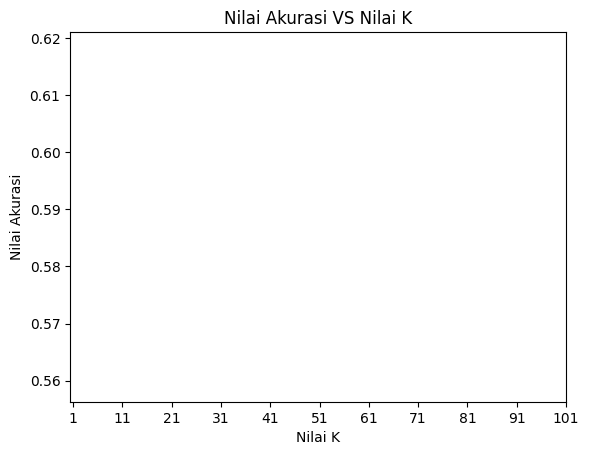

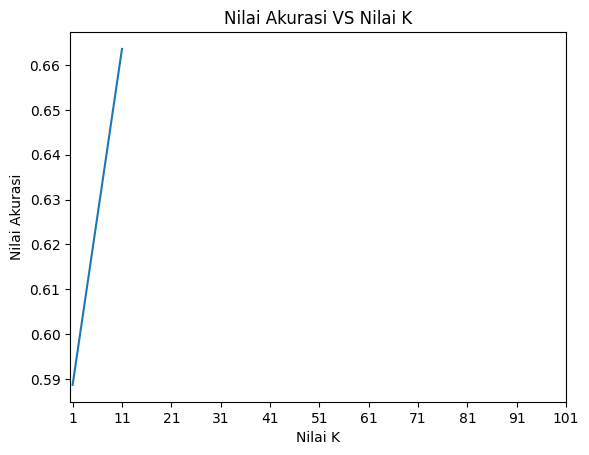

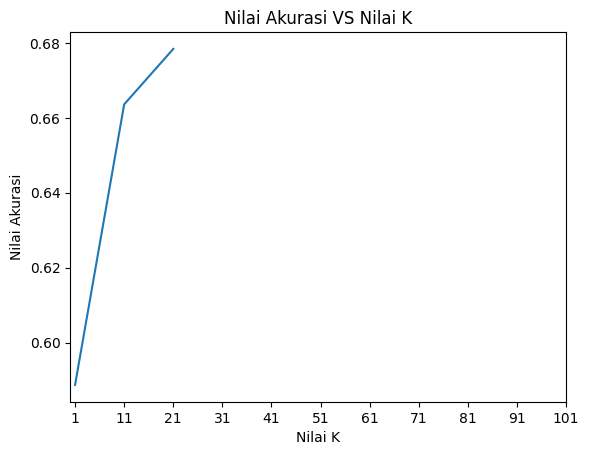

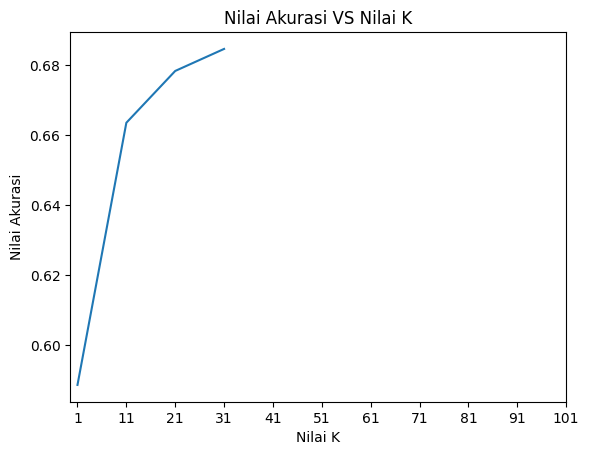

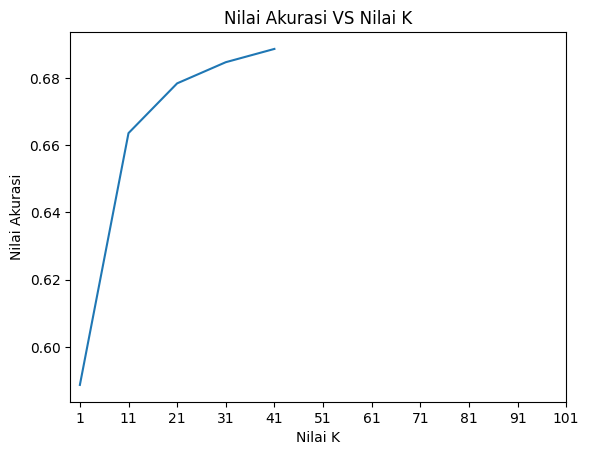

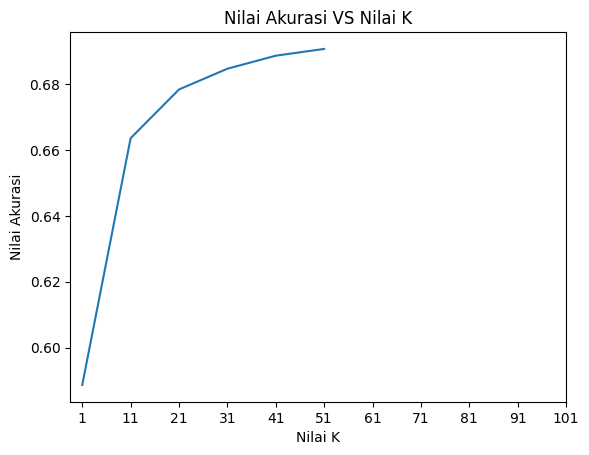

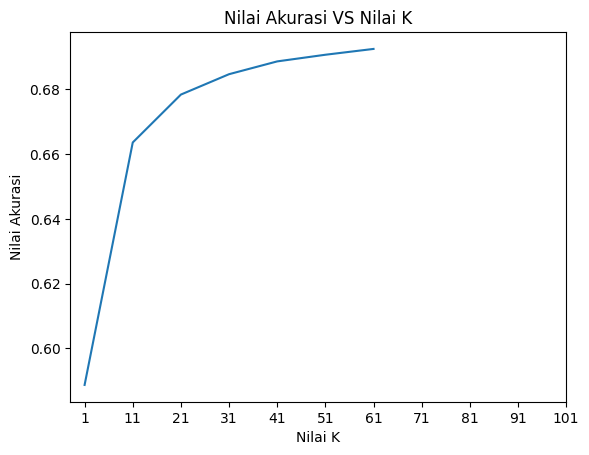

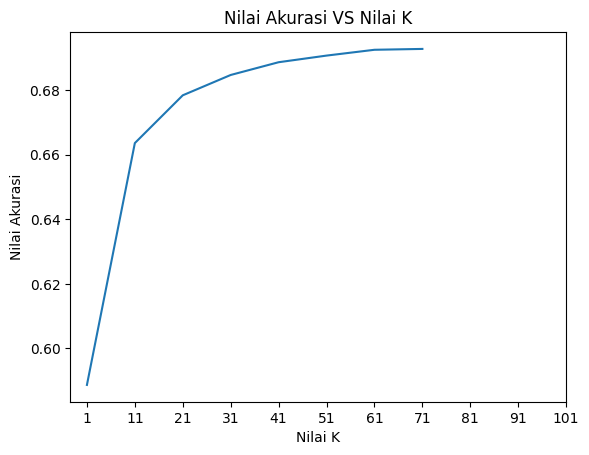

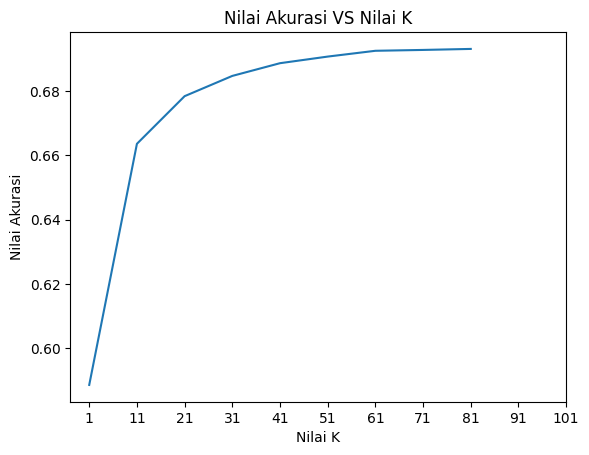

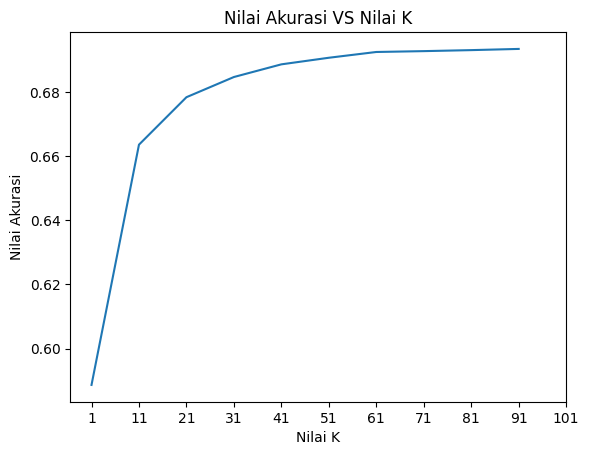

In [ ]:
from statistics import *
import matplotlib.pyplot as plt

str(y)

hasil=[]
for i in range (1,101,10):
  knn = KNeighborsClassifier(n_neighbors=i)
  knn.fit(X_train, y_train)

  prediksi = knn.predict(X_test)

  accuracy = accuracy_score(y_test, prediksi)
  hasil.append(accuracy)
  plt.plot(hasil)
  plt.ylabel('Nilai Akurasi')
  plt.xlabel('Nilai K')
  plt.title('Nilai Akurasi VS Nilai K')
  plt.xticks(np.arange(11),('1', '11', '21', '31', '41', '51', '61', '71', '81', '91', '101'))
  plt.show()

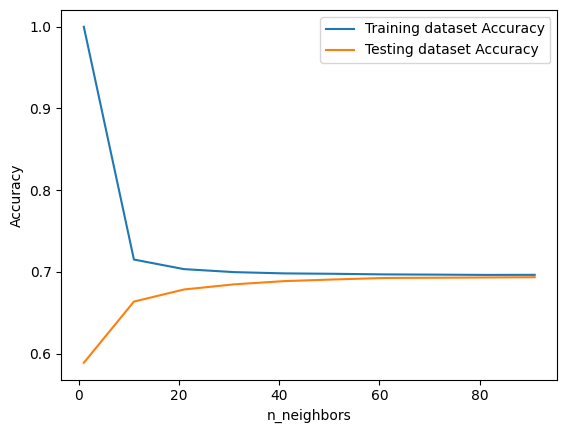

In [ ]:
neighbors = np.arange(1,101,10)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

# Loop over K values
for i, k in enumerate(neighbors):
	knn = KNeighborsClassifier(n_neighbors=k)
	knn.fit(X_train, y_train)

	# Compute training and test data accuracy
	train_accuracy[i] = knn.score(X_train, y_train)
	test_accuracy[i] = knn.score(X_test, y_test)

# Generate plot
plt.plot(neighbors, train_accuracy, label = 'Training dataset Accuracy')
plt.plot(neighbors, test_accuracy, label = 'Testing dataset Accuracy')

plt.legend()
plt.xlabel('n_neighbors')
plt.ylabel('Accuracy')
plt.show()

In [ ]:
knn = KNeighborsClassifier(n_neighbors=7)
knn.fit(X_train, y_train)
prediksi = knn.predict(X_test)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediksi))
print("\n")
print(classification_report(y_test, prediksi, target_names=CLASSES,zero_division=1))

Accuracy:  0.6496966913986031


              precision    recall  f1-score   support

          no       0.70      0.86      0.77     57471
         yes       0.35      0.17      0.22     25283

    accuracy                           0.65     82754
   macro avg       0.52      0.51      0.50     82754
weighted avg       0.59      0.65      0.61     82754



#### **KNN dengan Normalization**

Text(0, 0.5, 'Error rata-rata')

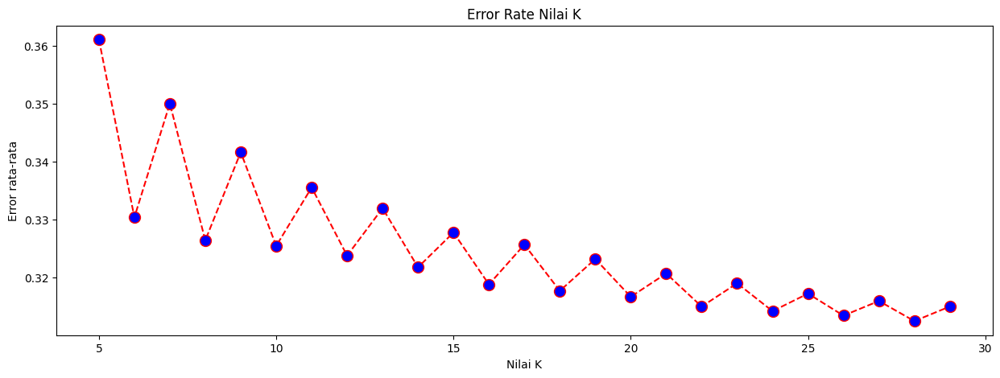

In [ ]:
error = []

# Menghitung kesalahan untuk nilai K antara 1 dan 60
for i in range(5, 30):
  knn_sc = KNeighborsClassifier(n_neighbors=i)
  knn_sc.fit(X_train_sc, y_train)
  pred_sc = knn_sc.predict(X_test_sc)
  error.append(np.mean(pred_sc != y_test))

plt.figure(figsize=(15, 5))
plt.plot(range(5, 30), error, color='red', linestyle='dashed', marker='o',
         markerfacecolor='blue', markersize=10)
plt.title('Error Rate Nilai K')
plt.xlabel('Nilai K')
plt.ylabel('Error rata-rata')

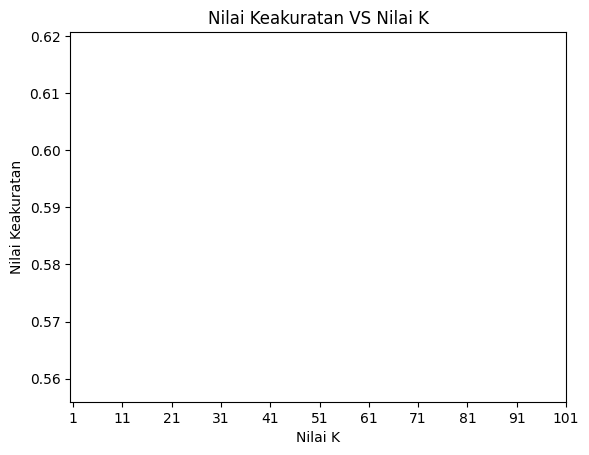

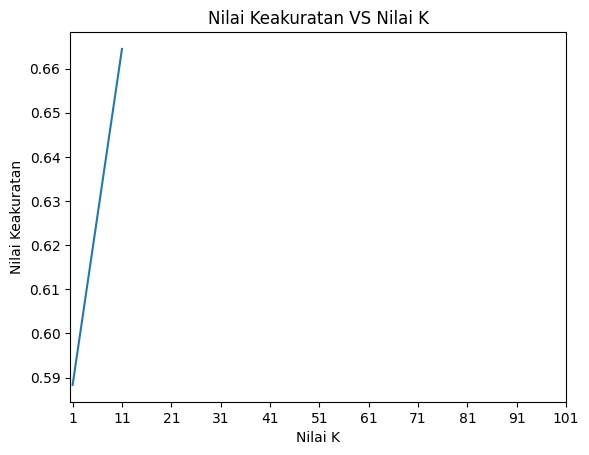

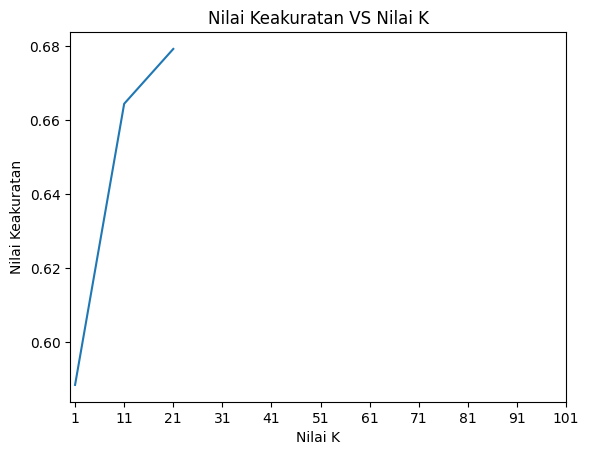

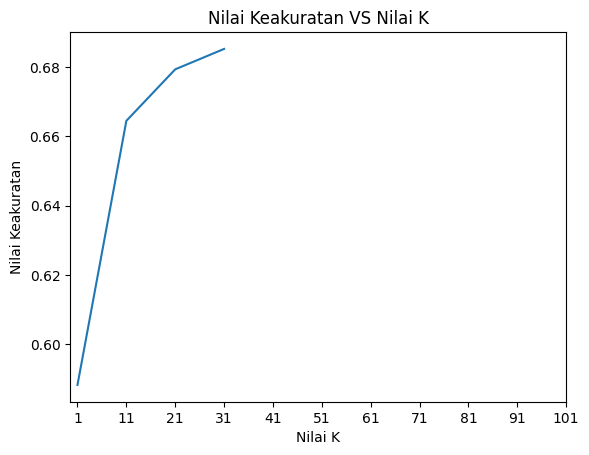

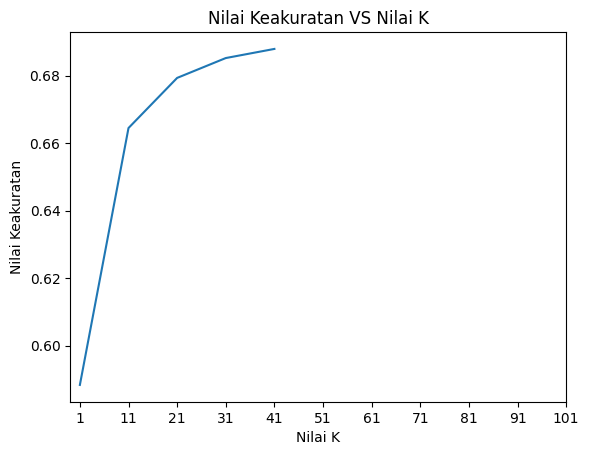

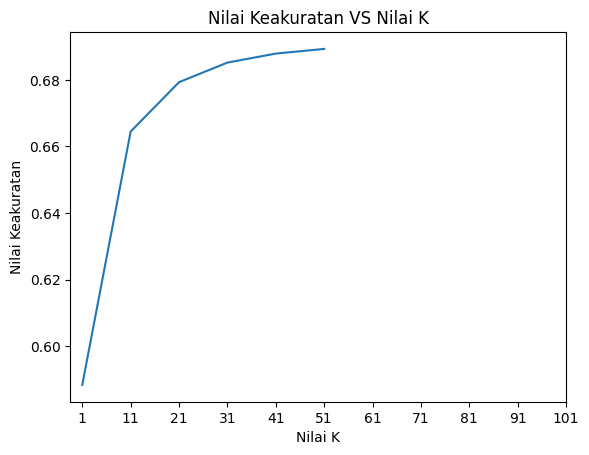

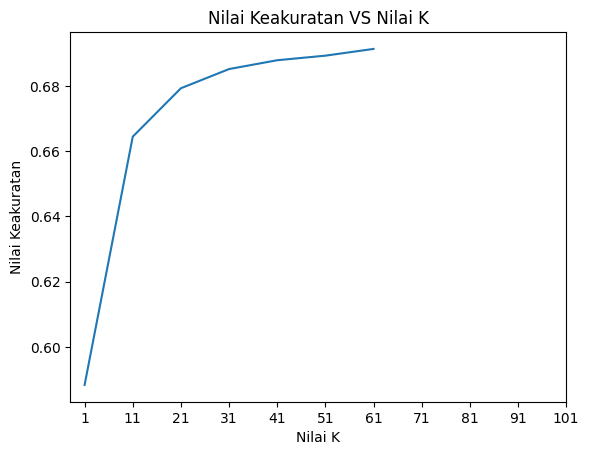

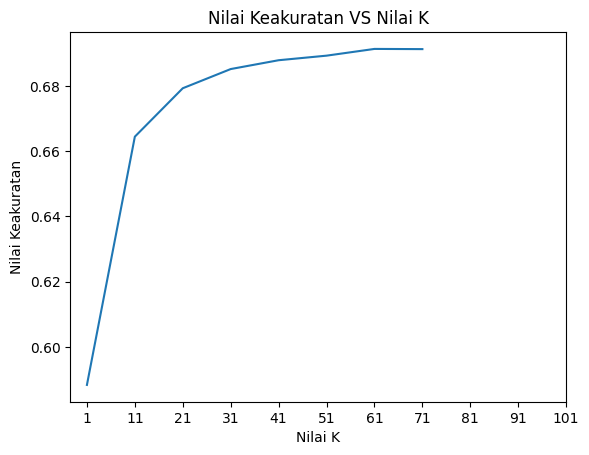

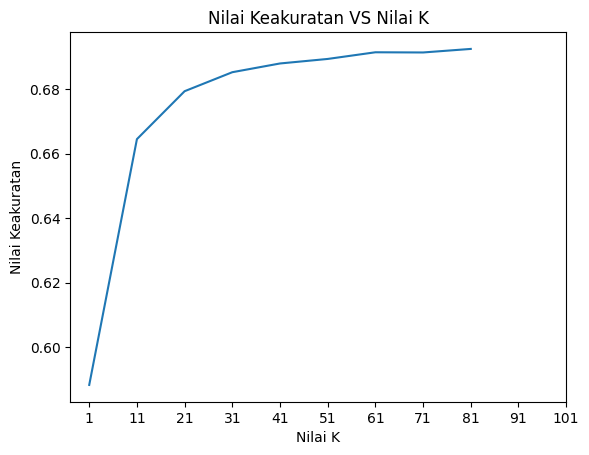

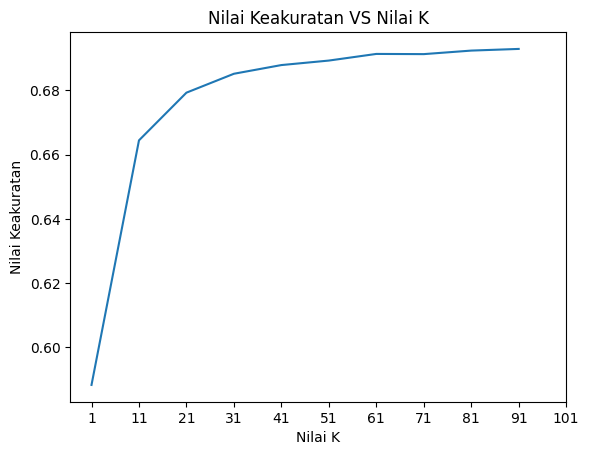

In [ ]:
from statistics import *
import matplotlib.pyplot as plt

str(y)

hasil=[]
for i in range (1,101,10):
    knn_sc = KNeighborsClassifier(n_neighbors=i)
    knn_sc.fit(X_train_sc, y_train)

    prediksi_sc = knn_sc.predict(X_test_sc)

    accuracy_sc = accuracy_score(y_test, prediksi_sc)
    hasil.append(accuracy_sc)
    plt.plot(hasil)
    plt.ylabel('Nilai Keakuratan')
    plt.xlabel('Nilai K')
    plt.title('Nilai Keakuratan VS Nilai K')
    plt.xticks(np.arange(11),('1', '11', '21', '31', '41', '51', '61', '71', '81', '91', '101'))
    plt.show()

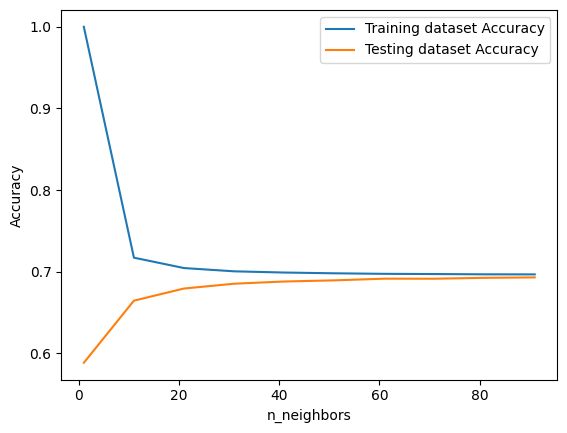

In [ ]:
neighbors = np.arange(1,101,10)
train_accuracy = np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

# Loop over K values
for i, k in enumerate(neighbors):
	knn_sc = KNeighborsClassifier(n_neighbors=k)
	knn_sc.fit(X_train_sc, y_train)

	# Compute training and test data accuracy
	train_accuracy[i] = knn_sc.score(X_train_sc, y_train)
	test_accuracy[i] = knn_sc.score(X_test_sc, y_test)

# Generate plot
plt.plot(neighbors, train_accuracy, label = 'Training dataset Accuracy')
plt.plot(neighbors, test_accuracy, label = 'Testing dataset Accuracy')


plt.legend()
plt.xlabel('n_neighbors')
plt.ylabel('Accuracy')
plt.show()

In [ ]:
knn_sc = KNeighborsClassifier(n_neighbors=7)
knn_sc.fit(X_train_sc, y_train)
prediksi_sc = knn_sc.predict(X_test_sc)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediksi_sc))
print("\n")
print(classification_report(y_test, prediksi_sc, target_names=CLASSES,zero_division=1))

Accuracy:  0.6499746235831501


              precision    recall  f1-score   support

          no       0.70      0.86      0.77     57471
         yes       0.36      0.18      0.24     25283

    accuracy                           0.65     82754
   macro avg       0.53      0.52      0.51     82754
weighted avg       0.60      0.65      0.61     82754



### **Decision Tree**

# **DT Tanpa Normalization**





In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

In [ ]:
# decision tree dengan default criterion: gini
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
prediction = dt.predict(X_test)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction))
print("\n")
print(classification_report(y_test, prediction, target_names=CLASSES, zero_division=1))

Accuracy:  0.5811320298716678


              precision    recall  f1-score   support

          no       0.70      0.69      0.70     57471
         yes       0.32      0.34      0.33     25283

    accuracy                           0.58     82754
   macro avg       0.51      0.51      0.51     82754
weighted avg       0.59      0.58      0.58     82754



In [ ]:
from sklearn import tree
from sklearn.tree import export_graphviz
import graphviz

dot_data = tree.export_graphviz(dt, out_file=None, filled=True, rounded=True,
                                feature_names=['Age', 'Marital Status', 'Education Level',
                                               'Number of Children', 'Smoking Status', 'Physical Activity Level',
                                               'Employment Status', 'Income', 'Alcohol Consumption', 'Dietary Habits', 'Sleep Patterns'],
                                class_names=['no', 'yes'])

graph = graphviz.Source(dot_data)
graph

KeyboardInterrupt: 

In [ ]:
# decision tree dengan criterion information gain
dt_entropy = DecisionTreeClassifier(criterion="entropy")
dt_entropy.fit(X_train, y_train)
prediction_entropy = dt_entropy.predict(X_test)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction_entropy))
print("\n")
print(classification_report(y_test, prediction_entropy, target_names=CLASSES,zero_division=1))

In [ ]:
# decision tree dengan criterion gini
dt_gini = DecisionTreeClassifier(criterion="gini")
dt_gini.fit(X_train, y_train)
prediction_gini = dt_gini.predict(X_test)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction_gini))
print("\n")
print(classification_report(y_test, prediction_gini, target_names=CLASSES,zero_division=1))

In [ ]:
# decision tree dengan criterion log_loss
dt_log_loss = DecisionTreeClassifier(criterion="log_loss")
dt_log_loss.fit(X_train, y_train)
prediction_log_loss = dt_log_loss.predict(X_test)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction_log_loss))
print("\n")
print(classification_report(y_test, prediction_log_loss, target_names=CLASSES,zero_division=1))

# **DT Dengan Normalization**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

In [ ]:
# decision tree dengan default criterion: gini
dt_sc = DecisionTreeClassifier()
dt_sc.fit(X_train_sc, y_train)
prediction_sc = dt_sc.predict(X_test_sc)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction_sc))
print("\n")
print(classification_report(y_test, prediction_sc, target_names=CLASSES, zero_division=1))

In [ ]:
from sklearn import tree
from sklearn.tree import export_graphviz
import graphviz

dot_data_sc = tree.export_graphviz(dt_sc, out_file=None, filled=True, rounded=True,
                                   feature_names=['Age', 'Marital Status', 'Education Level',
                                               'Number of Children', 'Smoking Status', 'Physical Activity Level',
                                               'Employment Status', 'Income', 'Alcohol Consumption', 'Dietary Habits', 'Sleep Patterns'],
                                   class_names=['no', 'yes'])

graph_sc = graphviz.Source(dot_data_sc)
graph_sc

In [ ]:
# decision tree dengan criterion information gain
dt_entropy_sc = DecisionTreeClassifier(criterion="entropy")
dt_entropy_sc.fit(X_train_sc, y_train)
prediction_entropy_sc = dt_entropy_sc.predict(X_test_sc)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction_entropy_sc))
print("\n")
print(classification_report(y_test, prediction_entropy_sc, target_names=CLASSES,zero_division=1))

In [ ]:
# decision tree dengan criterion gini
dt_gini_sc = DecisionTreeClassifier(criterion="gini")
dt_gini_sc.fit(X_train_sc, y_train)
prediction_gini_sc = dt_gini_sc.predict(X_test_sc)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction_gini_sc))
print("\n")
print(classification_report(y_test, prediction_gini_sc, target_names=CLASSES,zero_division=1))

In [ ]:
# decision tree dengan criterion log_loss
dt_log_loss_sc = DecisionTreeClassifier(criterion="log_loss")
dt_log_loss_sc.fit(X_train_sc, y_train)
prediction_log_loss_sc = dt_log_loss_sc.predict(X_test_sc)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction_log_loss_sc))
print("\n")
print(classification_report(y_test, prediction_log_loss_sc, target_names=CLASSES,zero_division=1))

# **DT Dengan SMOTE**

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report

In [ ]:
# decision tree dengan default criterion: gini
dt_smote = DecisionTreeClassifier()
dt_smote.fit(X_train_smote, y_train_smote)
prediction_smote = dt_smote.predict(X_test)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction_smote))
print("\n")
print(classification_report(y_test, prediction_smote, target_names=CLASSES,zero_division=1))

In [ ]:
from sklearn import tree
from sklearn.tree import export_graphviz
import graphviz

dot_data_smote = tree.export_graphviz(dt_smote, out_file=None, filled=True, rounded=True,
                                      feature_names=['Age', 'Marital Status', 'Education Level',
                                               'Number of Children', 'Smoking Status', 'Physical Activity Level',
                                               'Employment Status', 'Income', 'Alcohol Consumption', 'Dietary Habits', 'Sleep Patterns'],
                                      class_names=['no', 'yes'])
graph_smote = graphviz.Source(dot_data_smote)
graph_smote

In [ ]:
# decision tree dengan criterion information gain
dt_entropy_smote = DecisionTreeClassifier(criterion="entropy")
dt_entropy_smote.fit(X_train_smote, y_train_smote)
prediction_entropy_smote = dt_entropy_smote.predict(X_test)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction_entropy_smote))
print("\n")
print(classification_report(y_test, prediction_entropy_smote, target_names=CLASSES,zero_division=1))

In [ ]:
# decision tree dengan criterion gini
dt_gini_smote = DecisionTreeClassifier(criterion="gini")
dt_gini_smote.fit(X_train_smote, y_train_smote)
prediction_gini_smote = dt_gini_smote.predict(X_test)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction_gini_smote))
print("\n")
print(classification_report(y_test, prediction_gini_smote, target_names=CLASSES,zero_division=1))

In [ ]:
# decision tree dengan criterion log_loss
dt_log_loss_smote = DecisionTreeClassifier(criterion="log_loss")
dt_log_loss_smote.fit(X_train_smote, y_train_smote)
prediction_log_loss_smote = dt_log_loss_smote.predict(X_test)

In [ ]:
CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, prediction_log_loss_smote))
print("\n")
print(classification_report(y_test, prediction_log_loss_smote, target_names=CLASSES,zero_division=1))

# **Random Forest**

| Feature | Keterangan |
| --- | --- |
| Age | Usia setiap individu [years]
| Marital Status | Status pernikahan setiap individu [Single, Married, Divorced, Widowed]
| Education Level | Tingkat pendidikan yang diraih oleh setiap individu [Highschool, Associate Degree, Bachelor's Degree, Masters Degree, PhD]
| Number of Children | Jumlah anak yang dimiliki oleh setiap individu
| Smoking Status | Indikasi bahwa apakah individu tersebut adalah perokok atau bukan [Smoker, Former, Non-Smoker]
| Physical Activity Level | Level aktivitas fisik yang dilakukan setiap harinya oleh setiap individu [Sedentary, Moderate, Active]
| Employment Status | Status apakah setiap individu tersebut memiliki sebuah pekerjaan atau tidak [Employed, Unemployed]
| Income | Penghasilan setiap individu (USD)
| Alcohol Consumption | Level konsumsi alkohol setiap individu [Low, Moderate, High]
| Dietary Habits | Kebiasaan pola makan yang sehat [Healthy, Moderate, Unhealthy]
| Sleep Patterns | Pola tidur setiap individu [Good, Fair, Poor]
| History of Mental Illness | Riwayat sakit mental yang dialami oleh setiap individu [1: yes, 0: no]



#### **RF tanpa Normalization**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier(n_estimators=20, random_state=42)
rf.fit(X_train, y_train) # training
pred_rf = rf.predict(X_test)

CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, pred_rf))
print("\nClassification Report:\n", classification_report(y_test, pred_rf, target_names=CLASSES, zero_division=1))

Accuracy:  0.6493825071899848

Classification Report:
               precision    recall  f1-score   support

          no       0.70      0.86      0.77     57471
         yes       0.35      0.17      0.23     25283

    accuracy                           0.65     82754
   macro avg       0.53      0.52      0.50     82754
weighted avg       0.59      0.65      0.61     82754



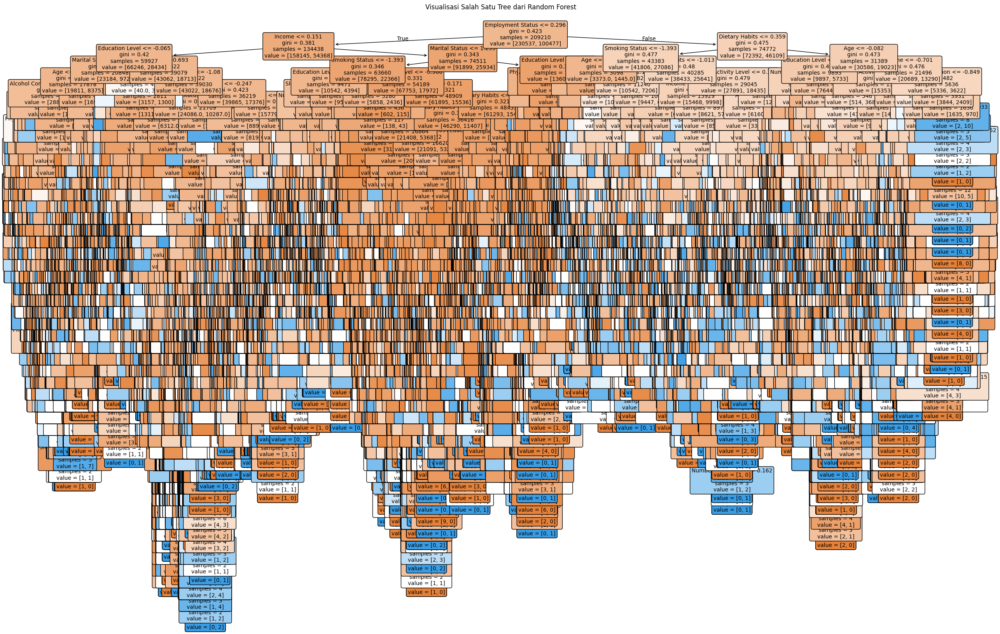

In [ ]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

plt.figure(figsize=(30, 20))
plot_tree(rf.estimators_[0], feature_names=list(X.columns), filled=True, rounded=True, fontsize=10)
plt.title("Visualisasi Salah Satu Tree dari Random Forest\n\n")
plt.show()

In [ ]:
# uji coba penerapan model, memprediksi input nilai berikut:
# MaritalStatus = 	2
# EducationLevel =	4
# SmokingStatus = 0
# PhysicalActivityLevel = 1
# AlcoholConsumption = 0
# SleepPatterns = 1
# HistoryMI = 0

def input_data_baru():
    print("Masukkan nilai untuk setiap fitur:")

    Age = int(input("Age: "))
    MaritalStatus = int(input("Marital Status [0: Tidak menikah, 1: Menikah, 2: Bercerai, 3: Lainnya]: "))
    EducationLevel = int(input("Education Level [0: Tidak sekolah, 1: SD, 2: SMP, 3: SMA, 4: Pendidikan tinggi]: "))
    NumberOfChildren = int(input("Number of Children: "))
    SmokingStatus = int(input("Smoking Status [0: Tidak pernah, 1: Pernah, 2: Aktif]: "))
    PhysicalActivityLevel = int(input("Physical Activity Level [0: Tidak aktif, 1: Moderat, 2: Sangat aktif]: "))
    EmploymentStatus = int(input("Employment Status [0: Tidak bekerja, 1: Bekerja]: "))
    Income = float(input("Income: "))
    AlcoholConsumption = int(input("Alcohol Consumption [0: Tidak pernah, 1: Kadang-kadang, 2: Sering]: "))
    DietaryHabits = int(input("Dietary Habits [0: Tidak sehat, 1: Moderat, 2: Sangat sehat]: "))
    SleepPatterns = int(input("Sleep Patterns [0: Tidak teratur, 1: Moderat, 2: Sehat]: "))
    HistoryOfMentalIlness = int(input("History of Mental Illness [0: Tidak ada, 1: Ada]: "))  # Input HistoryMI

    # Data baru sebagai DataFrame
    new_data = pd.DataFrame({
        'Age': [Age],
        'Marital Status': [MaritalStatus],
        'Education Level': [EducationLevel],
        'Number of Children': [NumberOfChildren],
        'Smoking Status': [SmokingStatus],
        'Physical Activity Level': [PhysicalActivityLevel],
        'Employment Status': [EmploymentStatus],
        'Income': [Income],
        'Alcohol Consumption': [AlcoholConsumption],
        'Dietary Habits': [DietaryHabits],
        'Sleep Patterns': [SleepPatterns],
        'HistoryMI': [HistoryOfMentalIlness]  # Tambahkan fitur HistoryMI
    })

    # Transform data baru menggunakan scaler yang sudah di-fit
    new_data_scaled = sc.transform(new_data)

    # Prediksi dengan model Random Forest yang sudah dilatih
    pred_new = rf.predict(new_data_scaled)
    prob_new = rf.predict_proba(new_data_scaled)

    # Hasil prediksi
    print(f"\nPrediksi: {'Berisiko depresi' if pred_new[0] == 1 else 'Tidak berisiko depresi'}")
    print("Probabilitas per kelas:")
    print(f"  Kelas 0 (Tidak berisiko depresi): {prob_new[0][0]:.2f}")
    print(f"  Kelas 1 (Berisiko depresi): {prob_new[0][1]:.2f}")



In [ ]:
def input_data_baru():
    print("Masukkan nilai untuk setiap fitur:")

    # Validasi keberadaan scaler dan model
    if 'sc' not in globals() or 'rf' not in globals():
        raise ValueError("Scaler ('sc') atau model ('rf') belum dilatih. Pastikan mereka tersedia sebelum menjalankan fungsi.")

    # Menerima input pengguna
    data_new = {}
    for col in X.columns:
        while True:
            try:
                value = float(input(f"{col}: "))
                data_new[col] = [value]
                break
            except ValueError:
                print(f"Input tidak valid untuk {col}. Masukkan angka.")

    # Konversi ke DataFrame dan validasi urutan fitur
    data_new_rf = pd.DataFrame(data_new).reindex(columns=X.columns, fill_value=0)

    # Transformasi menggunakan scaler
    data_new_sc = sc.transform(data_new_rf)

    # Prediksi menggunakan model
    pred_new = rf.predict(data_new_sc)
    prob_new = rf.predict_proba(data_new_sc)

    # Output hasil
    print(f"Prediksi kelas: {pred_new[0]}")
    print("Probabilitas per kelas:")
    for idx, prob in enumerate(prob_new[0]):
        print(f"  Kelas {idx}: {prob:.2f}")

# Panggil fungsi
input_data_baru()

Masukkan nilai untuk setiap fitur:
Age: 20
Marital Status: 2
Education Level: 1
Number of Children: 
Input tidak valid untuk Number of Children. Masukkan angka.
Number of Children: 
Input tidak valid untuk Number of Children. Masukkan angka.
Number of Children: 1
Smoking Status: 1
Physical Activity Level: 1
Employment Status: 1
Income: 1
Alcohol Consumption: 1
Dietary Habits: 1
Sleep Patterns: 1
Prediksi kelas: 0
Probabilitas per kelas:
  Kelas 0: 0.80
  Kelas 1: 0.20


#### **RF dgn Normalization**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_sc = RandomForestClassifier(n_estimators=20, random_state=42)
rf_sc.fit(X_train_sc, y_train)
pred_rf_sc = rf_sc.predict(X_test_sc)

CLASSES = ['normal', 'heart desease']
print("Accuracy: ", accuracy_score(y_test, pred_rf_sc))
print("\nClassification Report:\n", classification_report(y_test, pred_rf_sc, target_names=CLASSES, zero_division=1))

Accuracy:  0.6492374990936994

Classification Report:
                precision    recall  f1-score   support

       normal       0.70      0.86      0.77     57471
heart desease       0.35      0.17      0.23     25283

     accuracy                           0.65     82754
    macro avg       0.53      0.52      0.50     82754
 weighted avg       0.59      0.65      0.61     82754



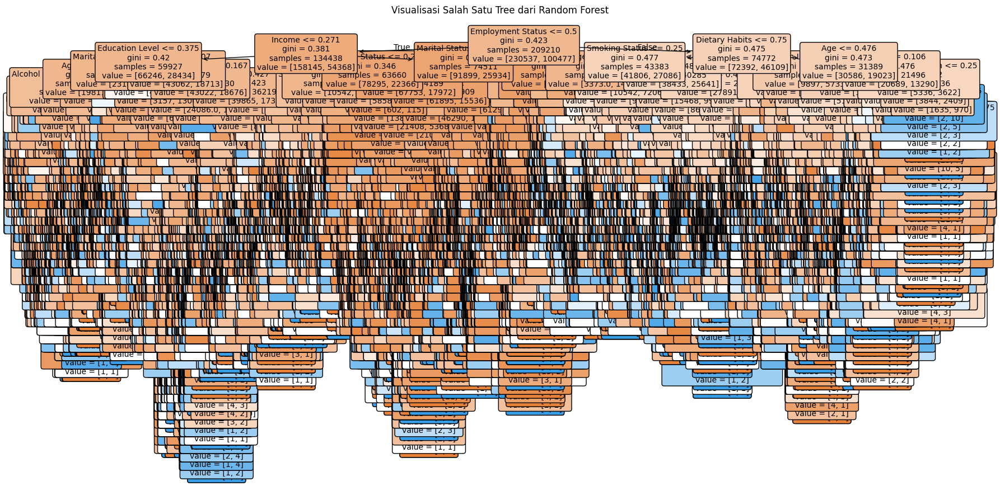

In [ ]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

plt.figure(figsize=(20, 10))
plot_tree(rf_sc.estimators_[0], feature_names=list(X.columns), filled=True, rounded=True, fontsize=10)
plt.title("Visualisasi Salah Satu Tree dari Random Forest\n\n")
plt.show()

In [ ]:
# uji coba penerapan model, memprediksi input nilai berikut:
# MaritalStatus = 	2
# EducationLevel =	4
# SmokingStatus = 0
# PhysicalActivityLevel = 1
# AlcoholConsumption = 0
# SleepPatterns = 1
# HistoryMI = 0

def input_data_baru():
    print("Masukkan nilai untuk setiap fitur:")

    Age = int(input("Age: "))
    MaritalStatus = int(input("Marital Status [0: Tidak menikah, 1: Menikah, 2: Bercerai, 3: Lainnya]: "))
    EducationLevel = int(input("Education Level [0: Tidak sekolah, 1: SD, 2: SMP, 3: SMA, 4: Pendidikan tinggi]: "))
    NumberOfChildren = int(input("Number of Children: "))
    SmokingStatus = int(input("Smoking Status [0: Tidak pernah, 1: Pernah, 2: Aktif]: "))
    PhysicalActivityLevel = int(input("Physical Activity Level [0: Tidak aktif, 1: Moderat, 2: Sangat aktif]: "))
    EmploymentStatus = int(input("Employment Status [0: Tidak bekerja, 1: Bekerja]: "))
    Income = float(input("Income: "))
    AlcoholConsumption = int(input("Alcohol Consumption [0: Tidak pernah, 1: Kadang-kadang, 2: Sering]: "))
    DietaryHabits = int(input("Dietary Habits [0: Tidak sehat, 1: Moderat, 2: Sangat sehat]: "))
    SleepPatterns = int(input("Sleep Patterns [0: Tidak teratur, 1: Moderat, 2: Sehat]: "))

    # Data baru sebagai DataFrame
    new_data = pd.DataFrame({
        'Age': [Age],
        'Marital Status': [MaritalStatus],
        'Education Level': [EducationLevel],
        'Number of Children': [NumberOfChildren],
        'Smoking Status': [SmokingStatus],
        'Physical Activity Level': [PhysicalActivityLevel],
        'Employment Status': [EmploymentStatus],
        'Income': [Income],
        'Alcohol Consumption': [AlcoholConsumption],
        'Dietary Habits': [DietaryHabits],
        'Sleep Patterns': [SleepPatterns]
    })

    # Transform data baru menggunakan scaler yang sudah di-fit
    new_data_scaled = sc.transform(new_data)

    # Prediksi dengan model Random Forest yang sudah dilatih
    pred_new = rf.predict(new_data_scaled)
    prob_new = rf.predict_proba(new_data_scaled)

    # Hasil prediksi
    print(f"\nPrediksi: {'Berisiko depresi' if pred_new[0] == 1 else 'Tidak berisiko depresi'}")
    print(f"Probabilitas kelas: {prob_new[0]}")



#### **RF dgn SMOTE**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_smote = RandomForestClassifier(n_estimators=20, random_state=42)
rf_smote.fit(X_train_smote, y_train_smote)
pred_rf_smote = rf_smote.predict(X_test_sc)

CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, pred_rf_smote))
print("\nClassification Report:\n", classification_report(y_test, pred_rf_smote, target_names=CLASSES, zero_division=1))

Accuracy:  0.5976508688401769

Classification Report:
               precision    recall  f1-score   support

          no       0.71      0.71      0.71     57471
         yes       0.34      0.34      0.34     25283

    accuracy                           0.60     82754
   macro avg       0.53      0.52      0.52     82754
weighted avg       0.60      0.60      0.60     82754



In [ ]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

plt.figure(figsize=(20, 20))
plot_tree(rf_smote.estimators_[0], feature_names=list(X.columns), filled=True, rounded=True, fontsize=10)
plt.title("Visualisasi Salah Satu Tree dari Random Forest\n\n")
plt.show()

KeyboardInterrupt: 

In [ ]:
# uji coba penerapan model, memprediksi input nilai berikut:
# MaritalStatus = 	2
# EducationLevel =	4
# SmokingStatus = 0
# PhysicalActivityLevel = 1
# AlcoholConsumption = 0
# SleepPatterns = 1
# HistoryMI = 0

def input_data_baru():
    print("Masukkan nilai untuk setiap fitur:")

    Age = int(input("Age: "))
    MaritalStatus = int(input("Marital Status [0: Tidak menikah, 1: Menikah, 2: Bercerai, 3: Lainnya]: "))
    EducationLevel = int(input("Education Level [0: Tidak sekolah, 1: SD, 2: SMP, 3: SMA, 4: Pendidikan tinggi]: "))
    NumberOfChildren = int(input("Number of Children: "))
    SmokingStatus = int(input("Smoking Status [0: Tidak pernah, 1: Pernah, 2: Aktif]: "))
    PhysicalActivityLevel = int(input("Physical Activity Level [0: Tidak aktif, 1: Moderat, 2: Sangat aktif]: "))
    EmploymentStatus = int(input("Employment Status [0: Tidak bekerja, 1: Bekerja]: "))
    Income = float(input("Income: "))
    AlcoholConsumption = int(input("Alcohol Consumption [0: Tidak pernah, 1: Kadang-kadang, 2: Sering]: "))
    DietaryHabits = int(input("Dietary Habits [0: Tidak sehat, 1: Moderat, 2: Sangat sehat]: "))
    SleepPatterns = int(input("Sleep Patterns [0: Tidak teratur, 1: Moderat, 2: Sehat]: "))

    # Data baru sebagai DataFrame
    new_data = pd.DataFrame({
        'Age': [Age],
        'Marital Status': [MaritalStatus],
        'Education Level': [EducationLevel],
        'Number of Children': [NumberOfChildren],
        'Smoking Status': [SmokingStatus],
        'Physical Activity Level': [PhysicalActivityLevel],
        'Employment Status': [EmploymentStatus],
        'Income': [Income],
        'Alcohol Consumption': [AlcoholConsumption],
        'Dietary Habits': [DietaryHabits],
        'Sleep Patterns': [SleepPatterns]
    })

    # Transform data baru menggunakan scaler yang sudah di-fit
    new_data_scaled = sc.transform(new_data)

    # Prediksi dengan model Random Forest yang sudah dilatih
    pred_new = rf.predict(new_data_scaled)
    prob_new = rf.predict_proba(new_data_scaled)

    # Hasil prediksi
    print(f"\nPrediksi: {'Berisiko depresi' if pred_new[0] == 1 else 'Tidak berisiko depresi'}")
    print(f"Probabilitas kelas: {prob_new[0]}")



#### **RF dgn Near Miss**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rf_miss = RandomForestClassifier(n_estimators=20, random_state=42)
rf_miss.fit(X_train_miss, y_train_miss)
pred_rf_miss = rf_miss.predict(X_test_sc)

CLASSES = ['no', 'yes']
print("Accuracy: ", accuracy_score(y_test, pred_rf_miss))
print("\nClassification Report:\n", classification_report(y_test, pred_rf_miss, target_names=CLASSES, zero_division=1))

Accuracy:  0.45083017135123377

Classification Report:
               precision    recall  f1-score   support

          no       0.69      0.38      0.49     57471
         yes       0.30      0.61      0.40     25283

    accuracy                           0.45     82754
   macro avg       0.50      0.49      0.45     82754
weighted avg       0.57      0.45      0.46     82754



In [ ]:
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree

plt.figure(figsize=(20, 10))
plot_tree(rf_miss.estimators_[0], feature_names=list(X.columns), filled=True, rounded=True, fontsize=10)
plt.title("Visualisasi Salah Satu Tree dari Random Forest\n\n")
plt.show()

In [ ]:
# uji coba penerapan model, memprediksi input nilai berikut:
# MaritalStatus = 	2
# EducationLevel =	4
# SmokingStatus = 0
# PhysicalActivityLevel = 1
# AlcoholConsumption = 0
# SleepPatterns = 1
# HistoryMI = 0

def input_data_baru():
    print("Masukkan nilai untuk setiap fitur:")

    Age = int(input("Age: "))
    MaritalStatus = int(input("Marital Status [0: Tidak menikah, 1: Menikah, 2: Bercerai, 3: Lainnya]: "))
    EducationLevel = int(input("Education Level [0: Tidak sekolah, 1: SD, 2: SMP, 3: SMA, 4: Pendidikan tinggi]: "))
    NumberOfChildren = int(input("Number of Children: "))
    SmokingStatus = int(input("Smoking Status [0: Tidak pernah, 1: Pernah, 2: Aktif]: "))
    PhysicalActivityLevel = int(input("Physical Activity Level [0: Tidak aktif, 1: Moderat, 2: Sangat aktif]: "))
    EmploymentStatus = int(input("Employment Status [0: Tidak bekerja, 1: Bekerja]: "))
    Income = float(input("Income: "))
    AlcoholConsumption = int(input("Alcohol Consumption [0: Tidak pernah, 1: Kadang-kadang, 2: Sering]: "))
    DietaryHabits = int(input("Dietary Habits [0: Tidak sehat, 1: Moderat, 2: Sangat sehat]: "))
    SleepPatterns = int(input("Sleep Patterns [0: Tidak teratur, 1: Moderat, 2: Sehat]: "))

    # Data baru sebagai DataFrame
    new_data = pd.DataFrame({
        'Age': [Age],
        'Marital Status': [MaritalStatus],
        'Education Level': [EducationLevel],
        'Number of Children': [NumberOfChildren],
        'Smoking Status': [SmokingStatus],
        'Physical Activity Level': [PhysicalActivityLevel],
        'Employment Status': [EmploymentStatus],
        'Income': [Income],
        'Alcohol Consumption': [AlcoholConsumption],
        'Dietary Habits': [DietaryHabits],
        'Sleep Patterns': [SleepPatterns]
    })

    # Transform data baru menggunakan scaler yang sudah di-fit
    new_data_scaled = sc.transform(new_data)

    # Prediksi dengan model Random Forest yang sudah dilatih
    pred_new = rf.predict(new_data_scaled)
    prob_new = rf.predict_proba(new_data_scaled)

    # Hasil prediksi
    print(f"\nPrediksi: {'Berisiko depresi' if pred_new[0] == 1 else 'Tidak berisiko depresi'}")
    print(f"Probabilitas kelas: {prob_new[0]}")



# **Hyperparameter Tuning Random Search CV**

In [ ]:
pip install optuna


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 364.4/364.4 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 233.5/233.5 kB 22.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.6/78.6 kB 8.0 MB/s eta 0:00:00


In [ ]:
# import time

# start_time = time.time()

# # Run a single trial to estimate time
# trial = study.ask()  # Get a trial object
# objective(trial)

# end_time = time.time()
# print(f"Time for one trial: {end_time - start_time} seconds")


In [ ]:
import optuna
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, accuracy_score

# Menggunakan data yang sudah di-split
print('dimensi data X_train: ', X_train.shape)
print('dimensi data X_test: ', X_test.shape)
print('dimensi data y_train: ', y_train.shape)
print('dimensi data y_test: ', y_test.shape)

def objective(trial):
    # Define hyperparameter space
    n_estimators = trial.suggest_int('n_estimators', 100, 500)
    max_depth = trial.suggest_int('max_depth', 15, 50)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 5)

    # Model
    model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        random_state=42
    )

    # Cross-validation pada data training
    scores = cross_val_score(model, X_train, y_train, cv=3, scoring='accuracy')
    return scores.mean()

# Run optimization
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=50)  # Mengurangi jumlah trial untuk kecepatan

# Get best parameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Train model with best parameters on full training data
final_model = RandomForestClassifier(**best_params, random_state=42)
final_model.fit(X_train, y_train)

# Evaluate on test data
y_pred = final_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Test Accuracy: {accuracy:.4f}")
print("Classification Report:\n", report)


[I 2025-01-07 07:35:09,068] A new study created in memory with name: no-name-58227951-50b7-435c-89bc-012185eff452


dimensi data X_train:  (331014, 11)
dimensi data X_test:  (82754, 11)
dimensi data y_train:  (331014,)
dimensi data y_test:  (82754,)


[I 2025-01-07 07:41:48,150] Trial 0 finished with value: 0.6904572012059913 and parameters: {'n_estimators': 262, 'max_depth': 48, 'min_samples_split': 5, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.6904572012059913.
[I 2025-01-07 07:49:15,070] Trial 1 finished with value: 0.6904330330439196 and parameters: {'n_estimators': 313, 'max_depth': 23, 'min_samples_split': 7, 'min_samples_leaf': 4}. Best is trial 0 with value: 0.6904572012059913.
[I 2025-01-07 07:53:41,382] Trial 2 finished with value: 0.681379035327811 and parameters: {'n_estimators': 173, 'max_depth': 45, 'min_samples_split': 9, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.6904572012059913.
[I 2025-01-07 08:00:25,035] Trial 3 finished with value: 0.6834514552254588 and parameters: {'n_estimators': 262, 'max_depth': 38, 'min_samples_split': 6, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.6904572012059913.
[I 2025-01-07 08:10:42,318] Trial 4 finished with value: 0.6856145057308755 and parameters: {

Best Hyperparameters: {'n_estimators': 479, 'max_depth': 15, 'min_samples_split': 3, 'min_samples_leaf': 5}
Test Accuracy: 0.6943
Classification Report:
               precision    recall  f1-score   support

           0       0.69      1.00      0.82     57471
           1       0.37      0.00      0.00     25283

    accuracy                           0.69     82754
   macro avg       0.53      0.50      0.41     82754
weighted avg       0.60      0.69      0.57     82754



In [ ]:
import optuna
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, accuracy_score
from imblearn.under_sampling import RandomUnderSampler
from sklearn.ensemble import RandomForestClassifier

# Menggunakan data yang sudah di-split
print('dimensi data X_train: ', X_train.shape)
print('dimensi data X_test: ', X_test.shape)
print('dimensi data y_train: ', y_train.shape)
print('dimensi data y_test: ', y_test.shape)

# Menggunakan RandomUnderSampler untuk menyeimbangkan distribusi kelas
rus = RandomUnderSampler(random_state=42)
X_train_resampled, y_train_resampled = rus.fit_resample(X_train, y_train)

print("Setelah Undersampling, jumlah label 0:", sum(y_train_resampled == 0))
print("Setelah Undersampling, jumlah label 1:", sum(y_train_resampled == 1))

def objective(trial):
    # Define hyperparameter space
    n_estimators = trial.suggest_int('n_estimators', 100, 500)
    max_depth = trial.suggest_int('max_depth', 15, 50)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 10)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 5)

    # Model
    model = RandomForestClassifier(
        n_estimators=n_estimators,
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        random_state=42
    )

    # Cross-validation pada data training yang sudah di-undersample
    scores = cross_val_score(model, X_train_resampled, y_train_resampled, cv=3, scoring='accuracy')
    return scores.mean()

# Run optimization
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=5)  # Mengurangi jumlah trial untuk kecepatan

# Get best parameters
best_params = study.best_params
print("Best Hyperparameters:", best_params)

# Train model with best parameters on full training data yang sudah di-undersample
final_model = RandomForestClassifier(**best_params, random_state=42)
final_model.fit(X_train_resampled, y_train_resampled)

# Evaluate on test data
y_pred = final_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
report = classification_report(y_test, y_pred)

print(f"Test Accuracy: {accuracy:.4f}")
print("Classification Report:\n", report)


dimensi data X_train:  (331014, 11)
dimensi data X_test:  (82754, 11)
dimensi data y_train:  (331014,)
dimensi data y_test:  (82754,)


[I 2025-01-09 00:12:44,946] A new study created in memory with name: no-name-c1137edd-e3d7-40bf-a807-f82172f2d204


Setelah Undersampling, jumlah label 0: 100542
Setelah Undersampling, jumlah label 1: 100542


[I 2025-01-09 00:14:52,660] Trial 0 finished with value: 0.56685763163653 and parameters: {'n_estimators': 182, 'max_depth': 19, 'min_samples_split': 6, 'min_samples_leaf': 4}. Best is trial 0 with value: 0.56685763163653.
[I 2025-01-09 00:18:21,521] Trial 1 finished with value: 0.5462344095005073 and parameters: {'n_estimators': 233, 'max_depth': 28, 'min_samples_split': 4, 'min_samples_leaf': 1}. Best is trial 0 with value: 0.56685763163653.
[I 2025-01-09 00:20:57,787] Trial 2 finished with value: 0.559701418312745 and parameters: {'n_estimators': 207, 'max_depth': 24, 'min_samples_split': 8, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.56685763163653.
[I 2025-01-09 00:24:54,068] Trial 3 finished with value: 0.5510781563923534 and parameters: {'n_estimators': 279, 'max_depth': 49, 'min_samples_split': 2, 'min_samples_leaf': 2}. Best is trial 0 with value: 0.56685763163653.
[I 2025-01-09 00:27:52,000] Trial 4 finished with value: 0.5584034532832051 and parameters: {'n_estimat

Best Hyperparameters: {'n_estimators': 182, 'max_depth': 19, 'min_samples_split': 6, 'min_samples_leaf': 4}
Test Accuracy: 0.5584
Classification Report:
               precision    recall  f1-score   support

           0       0.75      0.54      0.63     57471
           1       0.36      0.60      0.45     25283

    accuracy                           0.56     82754
   macro avg       0.56      0.57      0.54     82754
weighted avg       0.63      0.56      0.58     82754



In [ ]:

# Fungsi untuk menerima input data baru
def input_data_baru():
    print("Masukkan nilai untuk setiap fitur:")

    # Input nilai
    Age = int(input("Age: "))
    MaritalStatus = int(input("Marital Status [0: Tidak menikah, 1: Menikah, 2: Bercerai, 3: Lainnya]: "))
    EducationLevel = int(input("Education Level [0: Tidak sekolah, 1: SD, 2: SMP, 3: SMA, 4: Pendidikan tinggi]: "))
    NumberOfChildren = int(input("Number of Children: "))
    SmokingStatus = int(input("Smoking Status [0: Tidak pernah, 1: Pernah, 2: Aktif]: "))
    PhysicalActivityLevel = int(input("Physical Activity Level [0: Tidak aktif, 1: Moderat, 2: Sangat aktif]: "))
    EmploymentStatus = int(input("Employment Status [0: Tidak bekerja, 1: Bekerja]: "))
    Income = float(input("Income: "))
    AlcoholConsumption = int(input("Alcohol Consumption [0: Tidak pernah, 1: Kadang-kadang, 2: Sering]: "))
    DietaryHabits = int(input("Dietary Habits [0: Tidak sehat, 1: Moderat, 2: Sangat sehat]: "))
    SleepPatterns = int(input("Sleep Patterns [0: Tidak teratur, 1: Moderat, 2: Sehat]: "))

    # Data baru sebagai DataFrame
    new_data = pd.DataFrame({
        'Age': [Age],
        'Marital Status': [MaritalStatus],
        'Education Level': [EducationLevel],
        'Number of Children': [NumberOfChildren],
        'Smoking Status': [SmokingStatus],
        'Physical Activity Level': [PhysicalActivityLevel],
        'Employment Status': [EmploymentStatus],
        'Income': [Income],
        'Alcohol Consumption': [AlcoholConsumption],
        'Dietary Habits': [DietaryHabits],
        'Sleep Patterns': [SleepPatterns]
    })

    return new_data

# Input data baru
new_data = input_data_baru()

# Jika data perlu di-scaling
try:
    new_data_scaled = sc.transform(new_data)
except NameError:
    print("Scaler tidak ditemukan. Data akan digunakan tanpa scaling.")
    new_data_scaled = new_data

# Prediksi dengan model Random Forest yang sudah dilatih
try:
    pred_new = final_model.predict(new_data_scaled)
    prob_new = final_model.predict_proba(new_data_scaled)
except NameError:
    print("Model belum didefinisikan. Pastikan model sudah dilatih.")
    pred_new = None
    prob_new = None

# Output hasil prediksi
if pred_new is not None:
    print(f"\nPrediksi: {'Berisiko depresi' if pred_new[0] == 1 else 'Tidak berisiko depresi'}")
    print(f"Probabilitas kelas: {prob_new[0]}")
else:
    print("Prediksi tidak dapat dilakukan.")


Masukkan nilai untuk setiap fitur:
Age: 20
Marital Status [0: Tidak menikah, 1: Menikah, 2: Bercerai, 3: Lainnya]: 0
Education Level [0: Tidak sekolah, 1: SD, 2: SMP, 3: SMA, 4: Pendidikan tinggi]: 4
Number of Children: 0
Smoking Status [0: Tidak pernah, 1: Pernah, 2: Aktif]: 0
Physical Activity Level [0: Tidak aktif, 1: Moderat, 2: Sangat aktif]: 1
Employment Status [0: Tidak bekerja, 1: Bekerja]: 0
Income: 2000000
Alcohol Consumption [0: Tidak pernah, 1: Kadang-kadang, 2: Sering]: 0
Dietary Habits [0: Tidak sehat, 1: Moderat, 2: Sangat sehat]: 1
Sleep Patterns [0: Tidak teratur, 1: Moderat, 2: Sehat]: 0

Prediksi: Berisiko depresi
Probabilitas kelas: [0.46771739 0.53228261]


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


 Model prediksi depresi yang dibangun dengan algoritma Random Forest memiliki keterbatasan dalam memprediksi risiko depresi, dengan akurasi yang telah didapat dan performa yang lebih baik pada kelas mayoritas (tidak berisiko depresi) dibanding kelas minoritas (berisiko depresi). Meskipun recall untuk kelas minoritas meningkat setelah menerapkan Random Undersampling, precision tetap rendah, menunjukkan banyak prediksi "berisiko depresi" yang salah. Dengan probabilitas prediksi yang hampir seimbang pada data baru, model menunjukkan ketidakpastian yang disebabkan oleh kurangnya kemampuan dalam menangkap pola risiko depresi secara akurat.

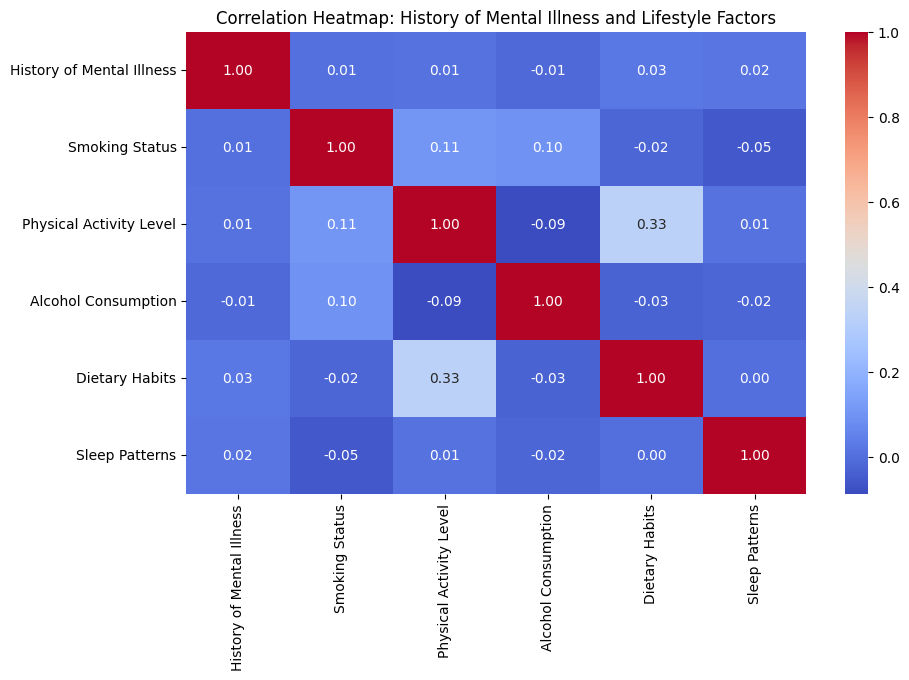

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Memilih kolom yang relevan
columns_of_interest = [
    "History of Mental Illness",
    "Smoking Status",
    "Physical Activity Level",
    "Alcohol Consumption",
    "Dietary Habits",
    "Sleep Patterns"
]

# Filter data sesuai kolom yang dibutuhkan
data_of_interest = data[columns_of_interest]  # Ganti `dataset` dengan nama DataFrame kamu

# Menghitung korelasi
correlation_matrix = data_of_interest.corr()

# Membuat heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar=True)
plt.title("Correlation Heatmap: History of Mental Illness and Lifestyle Factors")
plt.show()
